**Imports & Drive Mount**

In [ ]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
# from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings

In [ ]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [ ]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [ ]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints"
log_dir = "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs"

os.makedirs(checkpoint_dir, exist_ok=True)
os.makedirs(log_dir, exist_ok=True)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs"

Checkpoints will be saved to: D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints
TensorBoard logs will be saved to: D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs


**MONAI Preprocessing Transforms**

In [ ]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [ ]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [ ]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 49 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


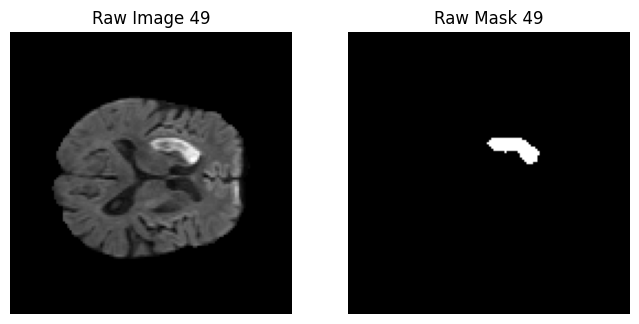

Sample 16 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


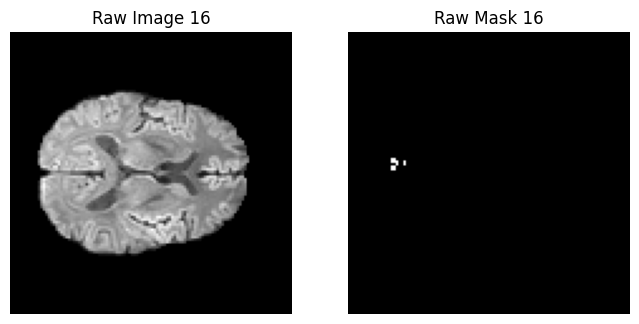

Client 0 - Preprocessed Samples:
Sample 49 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


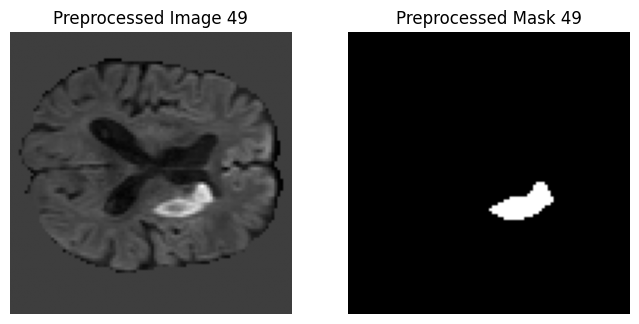

Sample 16 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


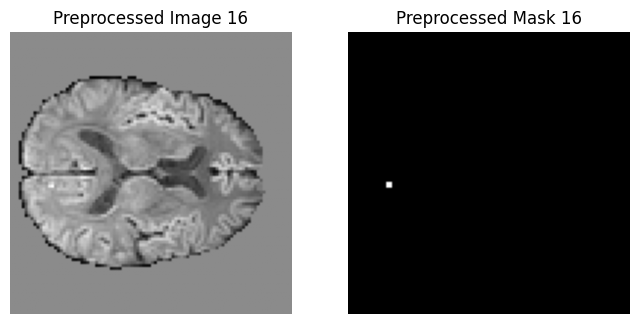

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 41 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


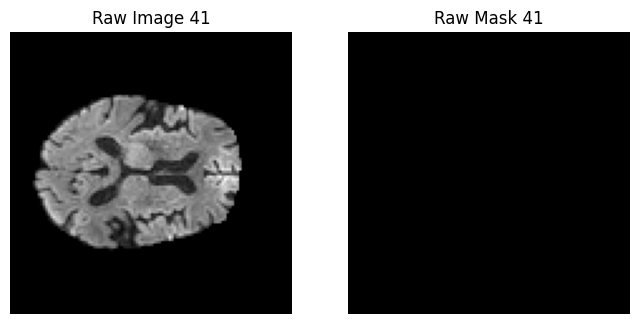

Sample 4 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


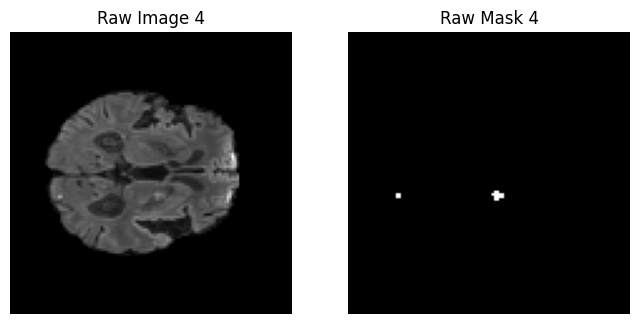

Client 1 - Preprocessed Samples:
Sample 41 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


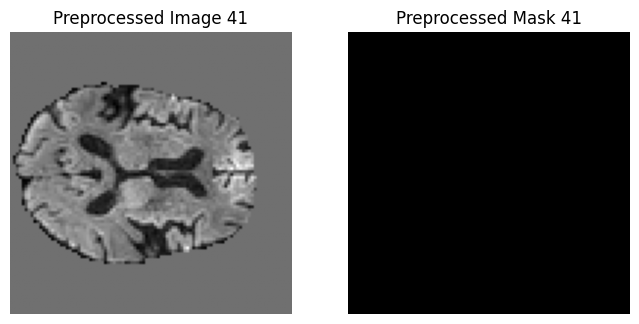

Sample 4 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


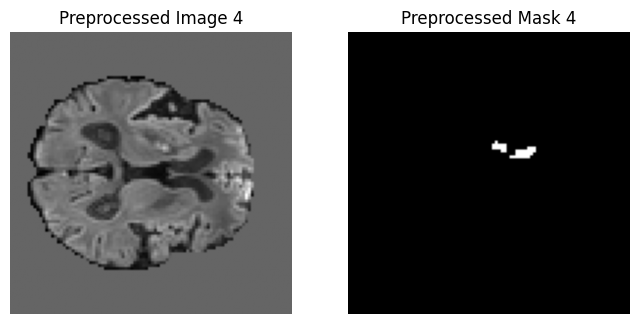

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 29 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


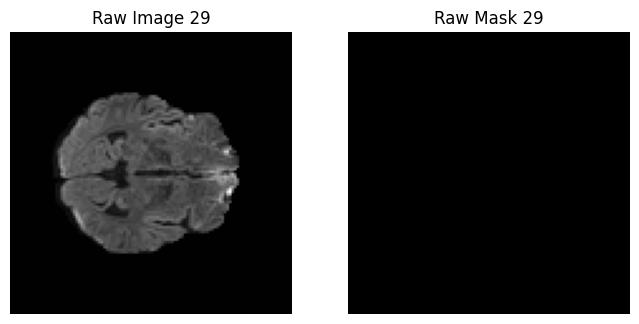

Sample 19 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


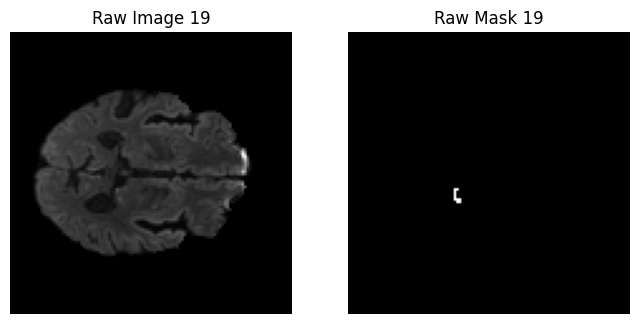

Client 2 - Preprocessed Samples:
Sample 29 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


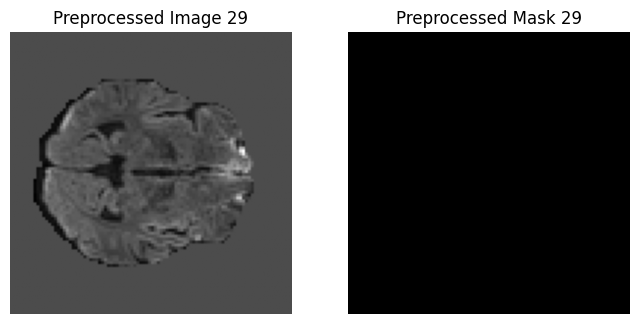

Sample 19 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


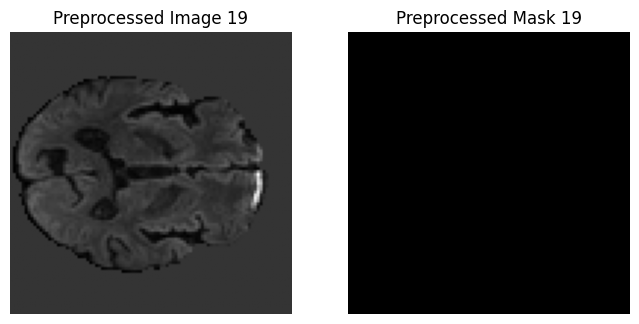

Client 2 samples: 50


In [ ]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [ ]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


Swin Factorizer

In [ ]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [ ]:
!pip install git+https://github.com/pashtari/factorizer.git

  Cloning https://github.com/pashtari/factorizer.git to C:\Users\LAB\AppData\Local\Temp\pip-req-build-v4m7fwav
  Resolved https://github.com/pashtari/factorizer.git to commit 9adcc5d3c5178d458f5720125ce450e7696f1e09
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---- ----------------------------------- 1.0/9.9 MB 4.2 MB/s eta 0:00:03
   ----------------- ---------------------- 4.5/9.9 MB 10.3 MB/s eta 0:00:01
   ----------------------

  Running command git clone --filter=blob:none --quiet https://github.com/pashtari/factorizer.git 'C:\Users\LAB\AppData\Local\Temp\pip-req-build-v4m7fwav'


In [ ]:
import factorizer as ft

In [ ]:
def create_model():
    model = ft.Factorizer(
        in_channels=1,
        out_channels=1,
        spatial_size=target_shape,
        encoder_depth=(1, 1, 1, 1),
        encoder_width=(32, 64, 128, 256),
        strides=(1, 2, 2, 2, 2),
        decoder_depth=(1, 1, 1, 1),
        norm=ft.LayerNorm,
        reshape=(ft.SWMatricize, {'head_dim': 8, 'patch_size': 2}),
        act=nn.ReLU,
        factorize=ft.NMF,
        rank=1,
        num_iters=3,
        init="uniform",
        solver="hals",
        mlp_ratio=2,
        dropout=0.1
    ).to(device)
    print(model)
    return model

**Client Class**

In [ ]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class (FedAvg)**

In [ ]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = copy.deepcopy(client_params_list[0])

        for key in new_params.keys():
            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]
            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [ ]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)
                

**Federated Training loop**

In [ ]:
communication_rounds = 50  # upper bound
local_epochs = 5
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 5   # stop if Dice does not improve for 5 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7900 | Dice: 0.0141 | IoU: 0.0071 | HD95: 38.6262


Client 0 | Epoch 2/5 | Loss: 0.6978 | Dice: 0.1227 | IoU: 0.0654 | HD95: 33.1790


Client 0 | Epoch 3/5 | Loss: 0.5872 | Dice: 0.1838 | IoU: 0.1012 | HD95: 31.8896


Client 0 | Epoch 4/5 | Loss: 0.5724 | Dice: 0.2062 | IoU: 0.1150 | HD95: 30.3546


Clients Training:  33%|███▎      | 1/3 [02:28<04:57, 148.71s/it]

Client 0 | Epoch 5/5 | Loss: 0.5509 | Dice: 0.2406 | IoU: 0.1367 | HD95: 31.9496
Client 0 | Loss=0.6396 | Dice=0.2406 | IoU=0.1367 | HD95=31.9496


Client 1 | Epoch 1/5 | Loss: 0.7894 | Dice: 0.0146 | IoU: 0.0074 | HD95: 35.6794


Client 1 | Epoch 2/5 | Loss: 0.6782 | Dice: 0.1457 | IoU: 0.0786 | HD95: 32.9908


Client 1 | Epoch 3/5 | Loss: 0.5851 | Dice: 0.1772 | IoU: 0.0972 | HD95: 31.8569


Client 1 | Epoch 4/5 | Loss: 0.5535 | Dice: 0.2237 | IoU: 0.1260 | HD95: 30.6376


Clients Training:  67%|██████▋   | 2/3 [05:11<02:36, 156.79s/it]

Client 1 | Epoch 5/5 | Loss: 0.5325 | Dice: 0.2565 | IoU: 0.1471 | HD95: 31.5156
Client 1 | Loss=0.6278 | Dice=0.2565 | IoU=0.1471 | HD95=31.5156


Client 2 | Epoch 1/5 | Loss: 0.7877 | Dice: 0.0220 | IoU: 0.0111 | HD95: 37.9859


Client 2 | Epoch 2/5 | Loss: 0.6733 | Dice: 0.2375 | IoU: 0.1348 | HD95: 32.3903


Client 2 | Epoch 3/5 | Loss: 0.5373 | Dice: 0.2439 | IoU: 0.1389 | HD95: 28.8635


Client 2 | Epoch 4/5 | Loss: 0.5110 | Dice: 0.2848 | IoU: 0.1660 | HD95: 33.0073


Client 2 Epochs: 100%|██████████| 5/5 [02:40<00:00, 32.12s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.4829 | Dice: 0.3229 | IoU: 0.1925 | HD95: 32.4382
Client 2 | Loss=0.5984 | Dice=0.3229 | IoU=0.1925 | HD95=32.4382


Best global model updated with Dice=0.2493
Global | Val Loss=0.5385 | Dice=0.2493 | IoU=0.1424 | HD95=34.5749
Checkpoint saved for round 1 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5315 | Dice: 0.2648 | IoU: 0.1526 | HD95: 32.6578


Client 0 | Epoch 2/5 | Loss: 0.5231 | Dice: 0.2766 | IoU: 0.1605 | HD95: 33.5247


Client 0 | Epoch 3/5 | Loss: 0.5168 | Dice: 0.2831 | IoU: 0.1649 | HD95: 33.2289


Client 0 | Epoch 4/5 | Loss: 0.5042 | Dice: 0.3033 | IoU: 0.1788 | HD95: 34.2491


Clients Training:  33%|███▎      | 1/3 [02:40<05:21, 160.57s/it]

Client 0 | Epoch 5/5 | Loss: 0.4946 | Dice: 0.3177 | IoU: 0.1888 | HD95: 31.6352
Client 0 | Loss=0.5141 | Dice=0.3177 | IoU=0.1888 | HD95=31.6352


Client 1 | Epoch 1/5 | Loss: 0.5155 | Dice: 0.2798 | IoU: 0.1626 | HD95: 31.8164


Client 1 | Epoch 2/5 | Loss: 0.5048 | Dice: 0.2943 | IoU: 0.1726 | HD95: 32.7480


Client 1 | Epoch 3/5 | Loss: 0.4925 | Dice: 0.3108 | IoU: 0.1840 | HD95: 32.3463


Client 1 | Epoch 4/5 | Loss: 0.4843 | Dice: 0.3237 | IoU: 0.1931 | HD95: 33.1556


Clients Training:  67%|██████▋   | 2/3 [05:15<02:37, 157.45s/it]

Client 1 | Epoch 5/5 | Loss: 0.4788 | Dice: 0.3316 | IoU: 0.1988 | HD95: 33.5757
Client 1 | Loss=0.4952 | Dice=0.3316 | IoU=0.1988 | HD95=33.5757


Client 2 | Epoch 1/5 | Loss: 0.4693 | Dice: 0.3448 | IoU: 0.2083 | HD95: 33.7325


Client 2 | Epoch 2/5 | Loss: 0.4576 | Dice: 0.3610 | IoU: 0.2203 | HD95: 32.5606


Client 2 | Epoch 3/5 | Loss: 0.4527 | Dice: 0.3679 | IoU: 0.2254 | HD95: 33.5944


Client 2 | Epoch 4/5 | Loss: 0.4446 | Dice: 0.3796 | IoU: 0.2343 | HD95: 33.1450


Client 2 Epochs: 100%|██████████| 5/5 [02:33<00:00, 30.73s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.4308 | Dice: 0.3992 | IoU: 0.2494 | HD95: 31.7349
Client 2 | Loss=0.4510 | Dice=0.3992 | IoU=0.2494 | HD95=31.7349


Best global model updated with Dice=0.3080
Global | Val Loss=0.4954 | Dice=0.3080 | IoU=0.1820 | HD95=36.7806
Checkpoint saved for round 2 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4848 | Dice: 0.3336 | IoU: 0.2002 | HD95: 32.8945


Client 0 | Epoch 2/5 | Loss: 0.4677 | Dice: 0.3562 | IoU: 0.2167 | HD95: 30.7691


Client 0 | Epoch 3/5 | Loss: 0.4515 | Dice: 0.3783 | IoU: 0.2333 | HD95: 28.8061


Client 0 | Epoch 4/5 | Loss: 0.4016 | Dice: 0.4532 | IoU: 0.2930 | HD95: 26.1064


Clients Training:  33%|███▎      | 1/3 [02:32<05:05, 152.95s/it]

Client 0 | Epoch 5/5 | Loss: 0.4065 | Dice: 0.4463 | IoU: 0.2872 | HD95: 25.3188
Client 0 | Loss=0.4424 | Dice=0.4463 | IoU=0.2872 | HD95=25.3188


Client 1 | Epoch 1/5 | Loss: 0.4601 | Dice: 0.3583 | IoU: 0.2182 | HD95: 31.9027


Client 1 | Epoch 2/5 | Loss: 0.4437 | Dice: 0.3796 | IoU: 0.2343 | HD95: 30.0904


Client 1 | Epoch 3/5 | Loss: 0.4282 | Dice: 0.4020 | IoU: 0.2515 | HD95: 28.2117


Client 1 | Epoch 4/5 | Loss: 0.4083 | Dice: 0.4294 | IoU: 0.2734 | HD95: 27.9415


Clients Training:  67%|██████▋   | 2/3 [05:06<02:33, 153.23s/it]

Client 1 | Epoch 5/5 | Loss: 0.3785 | Dice: 0.4722 | IoU: 0.3091 | HD95: 24.0841
Client 1 | Loss=0.4238 | Dice=0.4722 | IoU=0.3091 | HD95=24.0841


Client 2 | Epoch 1/5 | Loss: 0.4276 | Dice: 0.4026 | IoU: 0.2520 | HD95: 31.7633


Client 2 | Epoch 2/5 | Loss: 0.4175 | Dice: 0.4177 | IoU: 0.2640 | HD95: 30.2601


Client 2 | Epoch 3/5 | Loss: 0.4070 | Dice: 0.4300 | IoU: 0.2739 | HD95: 29.2318


Client 2 | Epoch 4/5 | Loss: 0.3826 | Dice: 0.4661 | IoU: 0.3038 | HD95: 27.6298


Client 2 Epochs: 100%|██████████| 5/5 [02:33<00:00, 30.77s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.3712 | Dice: 0.4810 | IoU: 0.3167 | HD95: 26.0894
Client 2 | Loss=0.4012 | Dice=0.4810 | IoU=0.3167 | HD95=26.0894


Best global model updated with Dice=0.4654
Global | Val Loss=0.3862 | Dice=0.4654 | IoU=0.3032 | HD95=26.7593
Checkpoint saved for round 3 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3731 | Dice: 0.4938 | IoU: 0.3279 | HD95: 23.5027


Client 0 | Epoch 2/5 | Loss: 0.3724 | Dice: 0.4932 | IoU: 0.3273 | HD95: 23.6323


Client 0 | Epoch 3/5 | Loss: 0.3416 | Dice: 0.5405 | IoU: 0.3703 | HD95: 20.4982


Client 0 | Epoch 4/5 | Loss: 0.3447 | Dice: 0.5360 | IoU: 0.3661 | HD95: 18.0528


Clients Training:  33%|███▎      | 1/3 [02:31<05:03, 151.96s/it]

Client 0 | Epoch 5/5 | Loss: 0.3041 | Dice: 0.5937 | IoU: 0.4222 | HD95: 16.3135
Client 0 | Loss=0.3472 | Dice=0.5937 | IoU=0.4222 | HD95=16.3135


Client 1 | Epoch 1/5 | Loss: 0.3692 | Dice: 0.4855 | IoU: 0.3205 | HD95: 23.7112


Client 1 | Epoch 2/5 | Loss: 0.3583 | Dice: 0.5006 | IoU: 0.3339 | HD95: 23.9694


Client 1 | Epoch 3/5 | Loss: 0.3228 | Dice: 0.5528 | IoU: 0.3820 | HD95: 18.7689


Client 1 | Epoch 4/5 | Loss: 0.3233 | Dice: 0.5507 | IoU: 0.3800 | HD95: 17.4990


Clients Training:  67%|██████▋   | 2/3 [05:04<02:32, 152.11s/it]

Client 1 | Epoch 5/5 | Loss: 0.3107 | Dice: 0.5697 | IoU: 0.3983 | HD95: 19.1373
Client 1 | Loss=0.3369 | Dice=0.5697 | IoU=0.3983 | HD95=19.1373


Client 2 | Epoch 1/5 | Loss: 0.3665 | Dice: 0.4893 | IoU: 0.3239 | HD95: 24.4304


Client 2 | Epoch 2/5 | Loss: 0.3351 | Dice: 0.5328 | IoU: 0.3632 | HD95: 22.0123


Client 2 | Epoch 3/5 | Loss: 0.3598 | Dice: 0.4980 | IoU: 0.3316 | HD95: 23.9721


Client 2 | Epoch 4/5 | Loss: 0.3128 | Dice: 0.5644 | IoU: 0.3931 | HD95: 19.8449


Client 2 Epochs: 100%|██████████| 5/5 [02:31<00:00, 30.21s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2872 | Dice: 0.6025 | IoU: 0.4312 | HD95: 16.8465
Client 2 | Loss=0.3323 | Dice=0.6025 | IoU=0.4312 | HD95=16.8465


Best global model updated with Dice=0.5460
Global | Val Loss=0.3306 | Dice=0.5460 | IoU=0.3756 | HD95=19.8740
Checkpoint saved for round 4 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2991 | Dice: 0.6005 | IoU: 0.4291 | HD95: 17.9721


Client 0 | Epoch 2/5 | Loss: 0.2902 | Dice: 0.6103 | IoU: 0.4392 | HD95: 14.4053


Client 0 | Epoch 3/5 | Loss: 0.3028 | Dice: 0.5911 | IoU: 0.4196 | HD95: 13.5947


Client 0 | Epoch 4/5 | Loss: 0.3087 | Dice: 0.5855 | IoU: 0.4139 | HD95: 16.7326


Clients Training:  33%|███▎      | 1/3 [02:30<05:00, 150.44s/it]

Client 0 | Epoch 5/5 | Loss: 0.2783 | Dice: 0.6296 | IoU: 0.4595 | HD95: 13.8753
Client 0 | Loss=0.2958 | Dice=0.6296 | IoU=0.4595 | HD95=13.8753


Client 1 | Epoch 1/5 | Loss: 0.3076 | Dice: 0.5707 | IoU: 0.3993 | HD95: 19.2994


Client 1 | Epoch 2/5 | Loss: 0.2936 | Dice: 0.5918 | IoU: 0.4203 | HD95: 15.7637


Client 1 | Epoch 3/5 | Loss: 0.3000 | Dice: 0.5818 | IoU: 0.4103 | HD95: 17.7460


Client 1 | Epoch 4/5 | Loss: 0.3047 | Dice: 0.5755 | IoU: 0.4040 | HD95: 16.5174


Clients Training:  67%|██████▋   | 2/3 [05:01<02:30, 150.75s/it]

Client 1 | Epoch 5/5 | Loss: 0.2822 | Dice: 0.6072 | IoU: 0.4359 | HD95: 14.3175
Client 1 | Loss=0.2976 | Dice=0.6072 | IoU=0.4359 | HD95=14.3175


Client 2 | Epoch 1/5 | Loss: 0.3153 | Dice: 0.5588 | IoU: 0.3878 | HD95: 18.6065


Client 2 | Epoch 2/5 | Loss: 0.2786 | Dice: 0.6123 | IoU: 0.4412 | HD95: 15.8387


Client 2 | Epoch 3/5 | Loss: 0.2767 | Dice: 0.6144 | IoU: 0.4435 | HD95: 14.5844


Client 2 | Epoch 4/5 | Loss: 0.2556 | Dice: 0.6433 | IoU: 0.4741 | HD95: 15.2396


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.14s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2742 | Dice: 0.6183 | IoU: 0.4475 | HD95: 15.0558
Client 2 | Loss=0.2801 | Dice=0.6183 | IoU=0.4475 | HD95=15.0558


Best global model updated with Dice=0.5702
Global | Val Loss=0.3119 | Dice=0.5702 | IoU=0.3988 | HD95=21.4045
Checkpoint saved for round 5 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2788 | Dice: 0.6288 | IoU: 0.4586 | HD95: 11.4060


Client 0 | Epoch 2/5 | Loss: 0.2720 | Dice: 0.6372 | IoU: 0.4675 | HD95: 13.7682


Client 0 | Epoch 3/5 | Loss: 0.2627 | Dice: 0.6505 | IoU: 0.4821 | HD95: 12.5302


Client 0 | Epoch 4/5 | Loss: 0.2549 | Dice: 0.6611 | IoU: 0.4937 | HD95: 10.7898


Clients Training:  33%|███▎      | 1/3 [02:30<05:00, 150.08s/it]

Client 0 | Epoch 5/5 | Loss: 0.2618 | Dice: 0.6528 | IoU: 0.4846 | HD95: 12.6450
Client 0 | Loss=0.2660 | Dice=0.6528 | IoU=0.4846 | HD95=12.6450


Client 1 | Epoch 1/5 | Loss: 0.2975 | Dice: 0.5841 | IoU: 0.4125 | HD95: 15.7880


Client 1 | Epoch 2/5 | Loss: 0.3159 | Dice: 0.5597 | IoU: 0.3886 | HD95: 19.2025


Client 1 | Epoch 3/5 | Loss: 0.2785 | Dice: 0.6117 | IoU: 0.4406 | HD95: 14.1161


Client 1 | Epoch 4/5 | Loss: 0.2633 | Dice: 0.6319 | IoU: 0.4618 | HD95: 13.3922


Clients Training:  67%|██████▋   | 2/3 [05:00<02:30, 150.50s/it]

Client 1 | Epoch 5/5 | Loss: 0.2522 | Dice: 0.6485 | IoU: 0.4798 | HD95: 14.1420
Client 1 | Loss=0.2815 | Dice=0.6485 | IoU=0.4798 | HD95=14.1420


Client 2 | Epoch 1/5 | Loss: 0.2694 | Dice: 0.6254 | IoU: 0.4550 | HD95: 14.8179


Client 2 | Epoch 2/5 | Loss: 0.2324 | Dice: 0.6783 | IoU: 0.5132 | HD95: 11.1478


Client 2 | Epoch 3/5 | Loss: 0.2540 | Dice: 0.6466 | IoU: 0.4778 | HD95: 13.7175


Client 2 | Epoch 4/5 | Loss: 0.2529 | Dice: 0.6499 | IoU: 0.4814 | HD95: 13.3344


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.12s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2322 | Dice: 0.6787 | IoU: 0.5136 | HD95: 10.7109
Client 2 | Loss=0.2482 | Dice=0.6787 | IoU=0.5136 | HD95=10.7109


Best global model updated with Dice=0.5996
Global | Val Loss=0.2920 | Dice=0.5996 | IoU=0.4282 | HD95=15.9245
Checkpoint saved for round 6 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2564 | Dice: 0.6598 | IoU: 0.4923 | HD95: 12.6290


Client 0 | Epoch 2/5 | Loss: 0.2502 | Dice: 0.6685 | IoU: 0.5020 | HD95: 12.3695


Client 0 | Epoch 3/5 | Loss: 0.2537 | Dice: 0.6643 | IoU: 0.4974 | HD95: 11.0749


Client 0 | Epoch 4/5 | Loss: 0.2617 | Dice: 0.6511 | IoU: 0.4827 | HD95: 14.9876


Clients Training:  33%|███▎      | 1/3 [02:31<05:02, 151.25s/it]

Client 0 | Epoch 5/5 | Loss: 0.2383 | Dice: 0.6847 | IoU: 0.5206 | HD95: 11.8816
Client 0 | Loss=0.2520 | Dice=0.6847 | IoU=0.5206 | HD95=11.8816


Client 1 | Epoch 1/5 | Loss: 0.2799 | Dice: 0.6092 | IoU: 0.4380 | HD95: 12.5446


Client 1 | Epoch 2/5 | Loss: 0.2481 | Dice: 0.6538 | IoU: 0.4856 | HD95: 12.6700


Client 1 | Epoch 3/5 | Loss: 0.2519 | Dice: 0.6482 | IoU: 0.4795 | HD95: 15.2078


Client 1 | Epoch 4/5 | Loss: 0.2598 | Dice: 0.6381 | IoU: 0.4686 | HD95: 14.8283


Clients Training:  67%|██████▋   | 2/3 [05:03<02:31, 151.61s/it]

Client 1 | Epoch 5/5 | Loss: 0.2389 | Dice: 0.6671 | IoU: 0.5005 | HD95: 12.4304
Client 1 | Loss=0.2557 | Dice=0.6671 | IoU=0.5005 | HD95=12.4304


Client 2 | Epoch 1/5 | Loss: 0.2237 | Dice: 0.6900 | IoU: 0.5267 | HD95: 10.6438


Client 2 | Epoch 2/5 | Loss: 0.2444 | Dice: 0.6620 | IoU: 0.4948 | HD95: 13.0547


Client 2 | Epoch 3/5 | Loss: 0.2434 | Dice: 0.6600 | IoU: 0.4925 | HD95: 13.7454


Client 2 | Epoch 4/5 | Loss: 0.2707 | Dice: 0.6217 | IoU: 0.4511 | HD95: 14.7458


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.01s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2132 | Dice: 0.7043 | IoU: 0.5435 | HD95: 11.5320
Client 2 | Loss=0.2391 | Dice=0.7043 | IoU=0.5435 | HD95=11.5320


Best global model updated with Dice=0.6039
Global | Val Loss=0.2883 | Dice=0.6039 | IoU=0.4325 | HD95=15.1163
Checkpoint saved for round 7 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2422 | Dice: 0.6785 | IoU: 0.5134 | HD95: 13.0171


Client 0 | Epoch 2/5 | Loss: 0.2617 | Dice: 0.6528 | IoU: 0.4845 | HD95: 11.9494


Client 0 | Epoch 3/5 | Loss: 0.2261 | Dice: 0.7037 | IoU: 0.5428 | HD95: 10.9160


Client 0 | Epoch 4/5 | Loss: 0.2254 | Dice: 0.7073 | IoU: 0.5472 | HD95: 9.1133


Clients Training:  33%|███▎      | 1/3 [02:30<05:01, 150.62s/it]

Client 0 | Epoch 5/5 | Loss: 0.2144 | Dice: 0.7197 | IoU: 0.5621 | HD95: 9.5646
Client 0 | Loss=0.2340 | Dice=0.7197 | IoU=0.5621 | HD95=9.5646


Client 1 | Epoch 1/5 | Loss: 0.2440 | Dice: 0.6592 | IoU: 0.4916 | HD95: 11.9678


Client 1 | Epoch 2/5 | Loss: 0.2696 | Dice: 0.6235 | IoU: 0.4530 | HD95: 14.6186


Client 1 | Epoch 3/5 | Loss: 0.2396 | Dice: 0.6663 | IoU: 0.4996 | HD95: 12.8569


Client 1 | Epoch 4/5 | Loss: 0.2141 | Dice: 0.7022 | IoU: 0.5410 | HD95: 11.3223


Clients Training:  67%|██████▋   | 2/3 [05:00<02:30, 150.37s/it]

Client 1 | Epoch 5/5 | Loss: 0.2240 | Dice: 0.6878 | IoU: 0.5241 | HD95: 13.5303
Client 1 | Loss=0.2383 | Dice=0.6878 | IoU=0.5241 | HD95=13.5303


Client 2 | Epoch 1/5 | Loss: 0.2107 | Dice: 0.7075 | IoU: 0.5474 | HD95: 10.9336


Client 2 | Epoch 2/5 | Loss: 0.2390 | Dice: 0.6680 | IoU: 0.5015 | HD95: 11.3424


Client 2 | Epoch 3/5 | Loss: 0.2277 | Dice: 0.6833 | IoU: 0.5189 | HD95: 12.8872


Client 2 | Epoch 4/5 | Loss: 0.2155 | Dice: 0.7016 | IoU: 0.5403 | HD95: 10.5958


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.82s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2034 | Dice: 0.7183 | IoU: 0.5604 | HD95: 8.4798
Client 2 | Loss=0.2192 | Dice=0.7183 | IoU=0.5604 | HD95=8.4798


Best global model updated with Dice=0.6306
Global | Val Loss=0.2701 | Dice=0.6306 | IoU=0.4605 | HD95=14.4660
Checkpoint saved for round 8 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2187 | Dice: 0.7125 | IoU: 0.5535 | HD95: 7.6327


Client 0 | Epoch 2/5 | Loss: 0.2277 | Dice: 0.7007 | IoU: 0.5393 | HD95: 7.6828


Client 0 | Epoch 3/5 | Loss: 0.2131 | Dice: 0.7229 | IoU: 0.5661 | HD95: 10.0026


Client 0 | Epoch 4/5 | Loss: 0.2078 | Dice: 0.7296 | IoU: 0.5744 | HD95: 7.4256


Clients Training:  33%|███▎      | 1/3 [02:29<04:59, 149.69s/it]

Client 0 | Epoch 5/5 | Loss: 0.2058 | Dice: 0.7330 | IoU: 0.5785 | HD95: 8.8903
Client 0 | Loss=0.2146 | Dice=0.7330 | IoU=0.5785 | HD95=8.8903


Client 1 | Epoch 1/5 | Loss: 0.2325 | Dice: 0.6766 | IoU: 0.5113 | HD95: 11.7560


Client 1 | Epoch 2/5 | Loss: 0.2171 | Dice: 0.6979 | IoU: 0.5360 | HD95: 12.6999


Client 1 | Epoch 3/5 | Loss: 0.2054 | Dice: 0.7158 | IoU: 0.5574 | HD95: 10.6672


Client 1 | Epoch 4/5 | Loss: 0.2070 | Dice: 0.7110 | IoU: 0.5516 | HD95: 10.6632


Clients Training:  67%|██████▋   | 2/3 [04:59<02:29, 149.51s/it]

Client 1 | Epoch 5/5 | Loss: 0.2612 | Dice: 0.6315 | IoU: 0.4615 | HD95: 13.7497
Client 1 | Loss=0.2246 | Dice=0.6315 | IoU=0.4615 | HD95=13.7497


Client 2 | Epoch 1/5 | Loss: 0.2404 | Dice: 0.6639 | IoU: 0.4969 | HD95: 15.4699


Client 2 | Epoch 2/5 | Loss: 0.2027 | Dice: 0.7192 | IoU: 0.5616 | HD95: 11.5490


Client 2 | Epoch 3/5 | Loss: 0.1949 | Dice: 0.7290 | IoU: 0.5735 | HD95: 9.7144


Client 2 | Epoch 4/5 | Loss: 0.1989 | Dice: 0.7233 | IoU: 0.5665 | HD95: 8.7937


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.87s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1878 | Dice: 0.7378 | IoU: 0.5845 | HD95: 9.7738
Client 2 | Loss=0.2050 | Dice=0.7378 | IoU=0.5845 | HD95=9.7738


Global | Val Loss=0.2751 | Dice=0.6231 | IoU=0.4525 | HD95=16.8586
Checkpoint saved for round 9 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round9.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2169 | Dice: 0.7162 | IoU: 0.5579 | HD95: 12.2593


Client 0 | Epoch 2/5 | Loss: 0.2194 | Dice: 0.7145 | IoU: 0.5559 | HD95: 9.6436


Client 0 | Epoch 3/5 | Loss: 0.2157 | Dice: 0.7190 | IoU: 0.5612 | HD95: 10.2846


Client 0 | Epoch 4/5 | Loss: 0.2027 | Dice: 0.7368 | IoU: 0.5833 | HD95: 7.9834


Clients Training:  33%|███▎      | 1/3 [02:29<04:59, 149.98s/it]

Client 0 | Epoch 5/5 | Loss: 0.1907 | Dice: 0.7520 | IoU: 0.6026 | HD95: 7.7221
Client 0 | Loss=0.2091 | Dice=0.7520 | IoU=0.6026 | HD95=7.7221


Client 1 | Epoch 1/5 | Loss: 0.2125 | Dice: 0.7051 | IoU: 0.5445 | HD95: 11.9219


Client 1 | Epoch 2/5 | Loss: 0.2099 | Dice: 0.7075 | IoU: 0.5474 | HD95: 13.0025


Client 1 | Epoch 3/5 | Loss: 0.1982 | Dice: 0.7237 | IoU: 0.5671 | HD95: 10.7616


Client 1 | Epoch 4/5 | Loss: 0.1862 | Dice: 0.7437 | IoU: 0.5920 | HD95: 9.0443


Clients Training:  67%|██████▋   | 2/3 [05:00<02:30, 150.27s/it]

Client 1 | Epoch 5/5 | Loss: 0.1869 | Dice: 0.7415 | IoU: 0.5892 | HD95: 9.8202
Client 1 | Loss=0.1987 | Dice=0.7415 | IoU=0.5892 | HD95=9.8202


Client 2 | Epoch 1/5 | Loss: 0.2034 | Dice: 0.7173 | IoU: 0.5592 | HD95: 11.4889


Client 2 | Epoch 2/5 | Loss: 0.2046 | Dice: 0.7168 | IoU: 0.5586 | HD95: 9.5691


Client 2 | Epoch 3/5 | Loss: 0.1863 | Dice: 0.7416 | IoU: 0.5894 | HD95: 9.6135


Client 2 | Epoch 4/5 | Loss: 0.1841 | Dice: 0.7437 | IoU: 0.5919 | HD95: 8.6198


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.10s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1787 | Dice: 0.7514 | IoU: 0.6018 | HD95: 8.6939
Client 2 | Loss=0.1914 | Dice=0.7514 | IoU=0.6018 | HD95=8.6939


Best global model updated with Dice=0.6728
Global | Val Loss=0.2416 | Dice=0.6728 | IoU=0.5070 | HD95=12.7287
Checkpoint saved for round 10 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round10.pth

--- Communication Round 11 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2284 | Dice: 0.7003 | IoU: 0.5388 | HD95: 14.4919


Client 0 | Epoch 2/5 | Loss: 0.2067 | Dice: 0.7311 | IoU: 0.5762 | HD95: 8.6357


Client 0 | Epoch 3/5 | Loss: 0.1928 | Dice: 0.7509 | IoU: 0.6012 | HD95: 8.6306


Client 0 | Epoch 4/5 | Loss: 0.1904 | Dice: 0.7553 | IoU: 0.6068 | HD95: 9.0433


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.23s/it]

Client 0 | Epoch 5/5 | Loss: 0.1753 | Dice: 0.7767 | IoU: 0.6349 | HD95: 6.9064
Client 0 | Loss=0.1987 | Dice=0.7767 | IoU=0.6349 | HD95=6.9064


Client 1 | Epoch 1/5 | Loss: 0.1962 | Dice: 0.7280 | IoU: 0.5723 | HD95: 9.4461


Client 1 | Epoch 2/5 | Loss: 0.1912 | Dice: 0.7351 | IoU: 0.5812 | HD95: 9.8159


Client 1 | Epoch 3/5 | Loss: 0.1736 | Dice: 0.7613 | IoU: 0.6145 | HD95: 9.2388


Client 1 | Epoch 4/5 | Loss: 0.1726 | Dice: 0.7646 | IoU: 0.6190 | HD95: 8.8480


Clients Training:  67%|██████▋   | 2/3 [05:00<02:30, 150.21s/it]

Client 1 | Epoch 5/5 | Loss: 0.1734 | Dice: 0.7599 | IoU: 0.6127 | HD95: 9.3323
Client 1 | Loss=0.1814 | Dice=0.7599 | IoU=0.6127 | HD95=9.3323


Client 2 | Epoch 1/5 | Loss: 0.1982 | Dice: 0.7236 | IoU: 0.5669 | HD95: 9.6403


Client 2 | Epoch 2/5 | Loss: 0.1974 | Dice: 0.7263 | IoU: 0.5702 | HD95: 10.4659


Client 2 | Epoch 3/5 | Loss: 0.1744 | Dice: 0.7570 | IoU: 0.6090 | HD95: 8.7883


Client 2 | Epoch 4/5 | Loss: 0.1686 | Dice: 0.7651 | IoU: 0.6196 | HD95: 8.8430


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.04s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1694 | Dice: 0.7640 | IoU: 0.6181 | HD95: 9.4334
Client 2 | Loss=0.1816 | Dice=0.7640 | IoU=0.6181 | HD95=9.4334


Best global model updated with Dice=0.6734
Global | Val Loss=0.2419 | Dice=0.6734 | IoU=0.5077 | HD95=12.4046
Checkpoint saved for round 11 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round11.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 12 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1832 | Dice: 0.7649 | IoU: 0.6193 | HD95: 7.6868


Client 0 | Epoch 2/5 | Loss: 0.1821 | Dice: 0.7665 | IoU: 0.6214 | HD95: 8.0709


Client 0 | Epoch 3/5 | Loss: 0.1738 | Dice: 0.7777 | IoU: 0.6363 | HD95: 6.9629


Client 0 | Epoch 4/5 | Loss: 0.1757 | Dice: 0.7761 | IoU: 0.6342 | HD95: 8.4074


Clients Training:  33%|███▎      | 1/3 [02:30<05:00, 150.11s/it]

Client 0 | Epoch 5/5 | Loss: 0.1706 | Dice: 0.7816 | IoU: 0.6415 | HD95: 8.2761
Client 0 | Loss=0.1771 | Dice=0.7816 | IoU=0.6415 | HD95=8.2761


Client 1 | Epoch 1/5 | Loss: 0.1874 | Dice: 0.7410 | IoU: 0.5886 | HD95: 9.7822


Client 1 | Epoch 2/5 | Loss: 0.1919 | Dice: 0.7338 | IoU: 0.5795 | HD95: 11.1557


Client 1 | Epoch 3/5 | Loss: 0.2091 | Dice: 0.7098 | IoU: 0.5502 | HD95: 12.8992


Client 1 | Epoch 4/5 | Loss: 0.1768 | Dice: 0.7559 | IoU: 0.6075 | HD95: 10.2724


Clients Training:  67%|██████▋   | 2/3 [05:00<02:30, 150.56s/it]

Client 1 | Epoch 5/5 | Loss: 0.1975 | Dice: 0.7271 | IoU: 0.5712 | HD95: 8.3243
Client 1 | Loss=0.1925 | Dice=0.7271 | IoU=0.5712 | HD95=8.3243


Client 2 | Epoch 1/5 | Loss: 0.1702 | Dice: 0.7634 | IoU: 0.6173 | HD95: 8.2724


Client 2 | Epoch 2/5 | Loss: 0.1679 | Dice: 0.7656 | IoU: 0.6202 | HD95: 6.5499


Client 2 | Epoch 3/5 | Loss: 0.1837 | Dice: 0.7444 | IoU: 0.5928 | HD95: 9.8196


Client 2 | Epoch 4/5 | Loss: 0.1673 | Dice: 0.7682 | IoU: 0.6237 | HD95: 7.4501


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.96s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1584 | Dice: 0.7796 | IoU: 0.6389 | HD95: 7.9813
Client 2 | Loss=0.1695 | Dice=0.7796 | IoU=0.6389 | HD95=7.9813


Global | Val Loss=0.2465 | Dice=0.6664 | IoU=0.4997 | HD95=11.3383
Checkpoint saved for round 12 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round12.pth
No significant Dice improvement for 2 round(s)

--- Communication Round 13 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1793 | Dice: 0.7730 | IoU: 0.6299 | HD95: 6.3198


Client 0 | Epoch 2/5 | Loss: 0.1855 | Dice: 0.7588 | IoU: 0.6113 | HD95: 7.1806


Client 0 | Epoch 3/5 | Loss: 0.1844 | Dice: 0.7631 | IoU: 0.6170 | HD95: 8.1833


Client 0 | Epoch 4/5 | Loss: 0.1708 | Dice: 0.7819 | IoU: 0.6419 | HD95: 6.8738


Clients Training:  33%|███▎      | 1/3 [02:30<05:00, 150.39s/it]

Client 0 | Epoch 5/5 | Loss: 0.1686 | Dice: 0.7862 | IoU: 0.6477 | HD95: 8.6394
Client 0 | Loss=0.1777 | Dice=0.7862 | IoU=0.6477 | HD95=8.6394


Client 1 | Epoch 1/5 | Loss: 0.1640 | Dice: 0.7744 | IoU: 0.6318 | HD95: 7.2371


Client 1 | Epoch 2/5 | Loss: 0.1609 | Dice: 0.7791 | IoU: 0.6381 | HD95: 9.0224


Client 1 | Epoch 3/5 | Loss: 0.1578 | Dice: 0.7818 | IoU: 0.6417 | HD95: 7.1851


Client 1 | Epoch 4/5 | Loss: 0.1516 | Dice: 0.7908 | IoU: 0.6539 | HD95: 8.2103


Clients Training:  67%|██████▋   | 2/3 [05:01<02:30, 150.98s/it]

Client 1 | Epoch 5/5 | Loss: 0.1517 | Dice: 0.7904 | IoU: 0.6535 | HD95: 7.6046
Client 1 | Loss=0.1572 | Dice=0.7904 | IoU=0.6535 | HD95=7.6046


Client 2 | Epoch 1/5 | Loss: 0.1815 | Dice: 0.7477 | IoU: 0.5970 | HD95: 8.7961


Client 2 | Epoch 2/5 | Loss: 0.1658 | Dice: 0.7698 | IoU: 0.6258 | HD95: 8.5564


Client 2 | Epoch 3/5 | Loss: 0.1614 | Dice: 0.7752 | IoU: 0.6329 | HD95: 7.3841


Client 2 | Epoch 4/5 | Loss: 0.1715 | Dice: 0.7624 | IoU: 0.6160 | HD95: 9.0480


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.03s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1640 | Dice: 0.7715 | IoU: 0.6280 | HD95: 8.4865
Client 2 | Loss=0.1688 | Dice=0.7715 | IoU=0.6280 | HD95=8.4865


Global | Val Loss=0.2431 | Dice=0.6692 | IoU=0.5028 | HD95=13.8520
Checkpoint saved for round 13 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round13.pth

--- Communication Round 14 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1692 | Dice: 0.7850 | IoU: 0.6461 | HD95: 5.4679


Client 0 | Epoch 2/5 | Loss: 0.1794 | Dice: 0.7700 | IoU: 0.6260 | HD95: 8.2715


Client 0 | Epoch 3/5 | Loss: 0.1641 | Dice: 0.7921 | IoU: 0.6557 | HD95: 6.1069


Client 0 | Epoch 4/5 | Loss: 0.1579 | Dice: 0.8004 | IoU: 0.6673 | HD95: 5.6018


Clients Training:  33%|███▎      | 1/3 [02:30<05:00, 150.16s/it]

Client 0 | Epoch 5/5 | Loss: 0.1556 | Dice: 0.8051 | IoU: 0.6737 | HD95: 5.4040
Client 0 | Loss=0.1652 | Dice=0.8051 | IoU=0.6737 | HD95=5.4040


Client 1 | Epoch 1/5 | Loss: 0.1740 | Dice: 0.7601 | IoU: 0.6130 | HD95: 8.6461


Client 1 | Epoch 2/5 | Loss: 0.1833 | Dice: 0.7453 | IoU: 0.5940 | HD95: 10.2000


Client 1 | Epoch 3/5 | Loss: 0.1570 | Dice: 0.7841 | IoU: 0.6449 | HD95: 7.2032


Client 1 | Epoch 4/5 | Loss: 0.1669 | Dice: 0.7708 | IoU: 0.6271 | HD95: 9.1170


Clients Training:  67%|██████▋   | 2/3 [05:01<02:31, 151.01s/it]

Client 1 | Epoch 5/5 | Loss: 0.1665 | Dice: 0.7703 | IoU: 0.6264 | HD95: 7.9064
Client 1 | Loss=0.1695 | Dice=0.7703 | IoU=0.6264 | HD95=7.9064


Client 2 | Epoch 1/5 | Loss: 0.1752 | Dice: 0.7557 | IoU: 0.6073 | HD95: 8.9672


Client 2 | Epoch 2/5 | Loss: 0.1578 | Dice: 0.7806 | IoU: 0.6401 | HD95: 7.6994


Client 2 | Epoch 3/5 | Loss: 0.1596 | Dice: 0.7783 | IoU: 0.6370 | HD95: 8.5292


Client 2 | Epoch 4/5 | Loss: 0.1494 | Dice: 0.7939 | IoU: 0.6582 | HD95: 7.6027


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.03s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1635 | Dice: 0.7732 | IoU: 0.6303 | HD95: 7.4388
Client 2 | Loss=0.1611 | Dice=0.7732 | IoU=0.6303 | HD95=7.4388


Global | Val Loss=0.2542 | Dice=0.6538 | IoU=0.4857 | HD95=14.0910
Checkpoint saved for round 14 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round14.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 15 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1693 | Dice: 0.7832 | IoU: 0.6436 | HD95: 5.6390


Client 0 | Epoch 2/5 | Loss: 0.1595 | Dice: 0.7982 | IoU: 0.6642 | HD95: 5.5959


Client 0 | Epoch 3/5 | Loss: 0.2004 | Dice: 0.7382 | IoU: 0.5850 | HD95: 11.6387


Client 0 | Epoch 4/5 | Loss: 0.1767 | Dice: 0.7760 | IoU: 0.6340 | HD95: 6.9819


Clients Training:  33%|███▎      | 1/3 [02:30<05:01, 150.98s/it]

Client 0 | Epoch 5/5 | Loss: 0.1687 | Dice: 0.7850 | IoU: 0.6461 | HD95: 4.3900
Client 0 | Loss=0.1749 | Dice=0.7850 | IoU=0.6461 | HD95=4.3900


Client 1 | Epoch 1/5 | Loss: 0.1549 | Dice: 0.7857 | IoU: 0.6470 | HD95: 7.7360


Client 1 | Epoch 2/5 | Loss: 0.1577 | Dice: 0.7823 | IoU: 0.6424 | HD95: 8.6284


Client 1 | Epoch 3/5 | Loss: 0.1488 | Dice: 0.7943 | IoU: 0.6588 | HD95: 7.8963


Client 1 | Epoch 4/5 | Loss: 0.1434 | Dice: 0.8022 | IoU: 0.6697 | HD95: 6.7246


Clients Training:  67%|██████▋   | 2/3 [05:02<02:31, 151.31s/it]

Client 1 | Epoch 5/5 | Loss: 0.1405 | Dice: 0.8066 | IoU: 0.6759 | HD95: 6.6049
Client 1 | Loss=0.1491 | Dice=0.8066 | IoU=0.6759 | HD95=6.6049


Client 2 | Epoch 1/5 | Loss: 0.1654 | Dice: 0.7699 | IoU: 0.6259 | HD95: 9.9835


Client 2 | Epoch 2/5 | Loss: 0.1632 | Dice: 0.7742 | IoU: 0.6315 | HD95: 8.4109


Client 2 | Epoch 3/5 | Loss: 0.1567 | Dice: 0.7820 | IoU: 0.6421 | HD95: 9.3527


Client 2 | Epoch 4/5 | Loss: 0.1551 | Dice: 0.7842 | IoU: 0.6450 | HD95: 9.9038


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.17s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1725 | Dice: 0.7598 | IoU: 0.6127 | HD95: 11.1236
Client 2 | Loss=0.1626 | Dice=0.7598 | IoU=0.6127 | HD95=11.1236


Global | Val Loss=0.2444 | Dice=0.6679 | IoU=0.5014 | HD95=13.0670
Checkpoint saved for round 15 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round15.pth

--- Communication Round 16 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1644 | Dice: 0.7936 | IoU: 0.6579 | HD95: 4.3340


Client 0 | Epoch 2/5 | Loss: 0.1567 | Dice: 0.8032 | IoU: 0.6711 | HD95: 5.4292


Client 0 | Epoch 3/5 | Loss: 0.1622 | Dice: 0.7941 | IoU: 0.6585 | HD95: 5.5048


Client 0 | Epoch 4/5 | Loss: 0.1536 | Dice: 0.8066 | IoU: 0.6759 | HD95: 5.3899


Clients Training:  33%|███▎      | 1/3 [02:30<05:00, 150.12s/it]

Client 0 | Epoch 5/5 | Loss: 0.1537 | Dice: 0.8050 | IoU: 0.6737 | HD95: 5.3781
Client 0 | Loss=0.1581 | Dice=0.8050 | IoU=0.6737 | HD95=5.3781


Client 1 | Epoch 1/5 | Loss: 0.1476 | Dice: 0.7971 | IoU: 0.6626 | HD95: 7.2325


Client 1 | Epoch 2/5 | Loss: 0.1428 | Dice: 0.8025 | IoU: 0.6701 | HD95: 6.8306


Client 1 | Epoch 3/5 | Loss: 0.1557 | Dice: 0.7862 | IoU: 0.6477 | HD95: 7.6469


Client 1 | Epoch 4/5 | Loss: 0.1525 | Dice: 0.7910 | IoU: 0.6542 | HD95: 8.2428


Clients Training:  67%|██████▋   | 2/3 [05:01<02:30, 150.60s/it]

Client 1 | Epoch 5/5 | Loss: 0.1545 | Dice: 0.7868 | IoU: 0.6486 | HD95: 8.1385
Client 1 | Loss=0.1506 | Dice=0.7868 | IoU=0.6486 | HD95=8.1385


Client 2 | Epoch 1/5 | Loss: 0.1621 | Dice: 0.7744 | IoU: 0.6319 | HD95: 8.5936


Client 2 | Epoch 2/5 | Loss: 0.1511 | Dice: 0.7906 | IoU: 0.6537 | HD95: 7.2511


Client 2 | Epoch 3/5 | Loss: 0.1530 | Dice: 0.7868 | IoU: 0.6486 | HD95: 8.5893


Client 2 | Epoch 4/5 | Loss: 0.2110 | Dice: 0.7069 | IoU: 0.5467 | HD95: 13.6970


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.94s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1638 | Dice: 0.7714 | IoU: 0.6278 | HD95: 10.7216
Client 2 | Loss=0.1682 | Dice=0.7714 | IoU=0.6278 | HD95=10.7216


Best global model updated with Dice=0.6823
Global | Val Loss=0.2341 | Dice=0.6823 | IoU=0.5178 | HD95=13.2217
Checkpoint saved for round 16 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round16.pth

--- Communication Round 17 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1561 | Dice: 0.8046 | IoU: 0.6731 | HD95: 4.4067


Client 0 | Epoch 2/5 | Loss: 0.1531 | Dice: 0.8059 | IoU: 0.6748 | HD95: 5.3503


Client 0 | Epoch 3/5 | Loss: 0.1521 | Dice: 0.8093 | IoU: 0.6796 | HD95: 5.7600


Client 0 | Epoch 4/5 | Loss: 0.1645 | Dice: 0.7890 | IoU: 0.6515 | HD95: 5.7446


Clients Training:  33%|███▎      | 1/3 [02:30<05:00, 150.43s/it]

Client 0 | Epoch 5/5 | Loss: 0.1637 | Dice: 0.7913 | IoU: 0.6546 | HD95: 6.7017
Client 0 | Loss=0.1579 | Dice=0.7913 | IoU=0.6546 | HD95=6.7017


Client 1 | Epoch 1/5 | Loss: 0.1468 | Dice: 0.7971 | IoU: 0.6626 | HD95: 7.1025


Client 1 | Epoch 2/5 | Loss: 0.1408 | Dice: 0.8056 | IoU: 0.6744 | HD95: 6.6389


Client 1 | Epoch 3/5 | Loss: 0.1376 | Dice: 0.8102 | IoU: 0.6810 | HD95: 6.6259


Client 1 | Epoch 4/5 | Loss: 0.1372 | Dice: 0.8109 | IoU: 0.6820 | HD95: 6.6203


Clients Training:  67%|██████▋   | 2/3 [05:01<02:30, 150.68s/it]

Client 1 | Epoch 5/5 | Loss: 0.1548 | Dice: 0.7856 | IoU: 0.6469 | HD95: 9.5846
Client 1 | Loss=0.1435 | Dice=0.7856 | IoU=0.6469 | HD95=9.5846


Client 2 | Epoch 1/5 | Loss: 0.1492 | Dice: 0.7929 | IoU: 0.6568 | HD95: 6.3048


Client 2 | Epoch 2/5 | Loss: 0.1677 | Dice: 0.7678 | IoU: 0.6231 | HD95: 8.5915


Client 2 | Epoch 3/5 | Loss: 0.1472 | Dice: 0.7959 | IoU: 0.6610 | HD95: 7.0468


Client 2 | Epoch 4/5 | Loss: 0.1595 | Dice: 0.7783 | IoU: 0.6371 | HD95: 8.1399


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.04s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1460 | Dice: 0.7974 | IoU: 0.6631 | HD95: 8.2235
Client 2 | Loss=0.1539 | Dice=0.7974 | IoU=0.6631 | HD95=8.2235


Global | Val Loss=0.2440 | Dice=0.6681 | IoU=0.5016 | HD95=13.9292
Checkpoint saved for round 17 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round17.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 18 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1537 | Dice: 0.8086 | IoU: 0.6787 | HD95: 4.2729


Client 0 | Epoch 2/5 | Loss: 0.1493 | Dice: 0.8125 | IoU: 0.6842 | HD95: 5.1862


Client 0 | Epoch 3/5 | Loss: 0.1557 | Dice: 0.8025 | IoU: 0.6702 | HD95: 4.1120


Client 0 | Epoch 4/5 | Loss: 0.1484 | Dice: 0.8129 | IoU: 0.6848 | HD95: 5.5633


Clients Training:  33%|███▎      | 1/3 [02:30<05:01, 150.51s/it]

Client 0 | Epoch 5/5 | Loss: 0.1431 | Dice: 0.8202 | IoU: 0.6952 | HD95: 4.9791
Client 0 | Loss=0.1500 | Dice=0.8202 | IoU=0.6952 | HD95=4.9791


Client 1 | Epoch 1/5 | Loss: 0.1439 | Dice: 0.8008 | IoU: 0.6678 | HD95: 7.1750


Client 1 | Epoch 2/5 | Loss: 0.1406 | Dice: 0.8067 | IoU: 0.6761 | HD95: 6.8383


Client 1 | Epoch 3/5 | Loss: 0.1396 | Dice: 0.8075 | IoU: 0.6771 | HD95: 7.9172


Client 1 | Epoch 4/5 | Loss: 0.1374 | Dice: 0.8102 | IoU: 0.6810 | HD95: 7.1204


Clients Training:  67%|██████▋   | 2/3 [05:01<02:30, 150.79s/it]

Client 1 | Epoch 5/5 | Loss: 0.1301 | Dice: 0.8212 | IoU: 0.6966 | HD95: 6.9844
Client 1 | Loss=0.1383 | Dice=0.8212 | IoU=0.6966 | HD95=6.9844


Client 2 | Epoch 1/5 | Loss: 0.1503 | Dice: 0.7911 | IoU: 0.6543 | HD95: 8.4694


Client 2 | Epoch 2/5 | Loss: 0.1422 | Dice: 0.8024 | IoU: 0.6700 | HD95: 7.6803


Client 2 | Epoch 3/5 | Loss: 0.1356 | Dice: 0.8111 | IoU: 0.6822 | HD95: 6.5255


Client 2 | Epoch 4/5 | Loss: 0.1324 | Dice: 0.8160 | IoU: 0.6892 | HD95: 6.1991


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.10s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1356 | Dice: 0.8107 | IoU: 0.6816 | HD95: 6.6286
Client 2 | Loss=0.1392 | Dice=0.8107 | IoU=0.6816 | HD95=6.6286


Global | Val Loss=0.2472 | Dice=0.6630 | IoU=0.4959 | HD95=14.5614
Checkpoint saved for round 18 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round18.pth
No significant Dice improvement for 2 round(s)

--- Communication Round 19 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1465 | Dice: 0.8178 | IoU: 0.6918 | HD95: 3.8509


Client 0 | Epoch 2/5 | Loss: 0.1433 | Dice: 0.8207 | IoU: 0.6959 | HD95: 4.6531


Client 0 | Epoch 3/5 | Loss: 0.1438 | Dice: 0.8179 | IoU: 0.6918 | HD95: 5.6398


Client 0 | Epoch 4/5 | Loss: 0.1469 | Dice: 0.8136 | IoU: 0.6858 | HD95: 5.4902


Clients Training:  33%|███▎      | 1/3 [02:29<04:59, 149.81s/it]

Client 0 | Epoch 5/5 | Loss: 0.1475 | Dice: 0.8134 | IoU: 0.6855 | HD95: 5.8416
Client 0 | Loss=0.1456 | Dice=0.8134 | IoU=0.6855 | HD95=5.8416


Client 1 | Epoch 1/5 | Loss: 0.1416 | Dice: 0.8046 | IoU: 0.6731 | HD95: 7.0173


Client 1 | Epoch 2/5 | Loss: 0.1351 | Dice: 0.8136 | IoU: 0.6858 | HD95: 6.5993


Client 1 | Epoch 3/5 | Loss: 0.1284 | Dice: 0.8236 | IoU: 0.7000 | HD95: 6.1251


Client 1 | Epoch 4/5 | Loss: 0.1268 | Dice: 0.8249 | IoU: 0.7019 | HD95: 6.5470


Clients Training:  67%|██████▋   | 2/3 [05:01<02:30, 150.86s/it]

Client 1 | Epoch 5/5 | Loss: 0.1296 | Dice: 0.8207 | IoU: 0.6960 | HD95: 6.6356
Client 1 | Loss=0.1323 | Dice=0.8207 | IoU=0.6960 | HD95=6.6356


Client 2 | Epoch 1/5 | Loss: 0.1342 | Dice: 0.8136 | IoU: 0.6858 | HD95: 7.4627


Client 2 | Epoch 2/5 | Loss: 0.1293 | Dice: 0.8207 | IoU: 0.6959 | HD95: 6.1194


Client 2 | Epoch 3/5 | Loss: 0.1284 | Dice: 0.8218 | IoU: 0.6974 | HD95: 6.2553


Client 2 | Epoch 4/5 | Loss: 0.1297 | Dice: 0.8198 | IoU: 0.6947 | HD95: 5.9481


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.89s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1316 | Dice: 0.8158 | IoU: 0.6889 | HD95: 6.0020
Client 2 | Loss=0.1306 | Dice=0.8158 | IoU=0.6889 | HD95=6.0020


Best global model updated with Dice=0.6870
Global | Val Loss=0.2320 | Dice=0.6870 | IoU=0.5232 | HD95=13.8695
Checkpoint saved for round 19 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round19.pth

--- Communication Round 20 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1443 | Dice: 0.8212 | IoU: 0.6966 | HD95: 4.1047


Client 0 | Epoch 2/5 | Loss: 0.1479 | Dice: 0.8143 | IoU: 0.6868 | HD95: 6.3548


Client 0 | Epoch 3/5 | Loss: 0.1433 | Dice: 0.8205 | IoU: 0.6956 | HD95: 5.0501


Client 0 | Epoch 4/5 | Loss: 0.1427 | Dice: 0.8213 | IoU: 0.6967 | HD95: 4.5368


Clients Training:  33%|███▎      | 1/3 [02:30<05:00, 150.24s/it]

Client 0 | Epoch 5/5 | Loss: 0.1417 | Dice: 0.8218 | IoU: 0.6975 | HD95: 5.8328
Client 0 | Loss=0.1440 | Dice=0.8218 | IoU=0.6975 | HD95=5.8328


Client 1 | Epoch 1/5 | Loss: 0.1316 | Dice: 0.8193 | IoU: 0.6939 | HD95: 6.6370


Client 1 | Epoch 2/5 | Loss: 0.1307 | Dice: 0.8201 | IoU: 0.6951 | HD95: 6.8327


Client 1 | Epoch 3/5 | Loss: 0.1262 | Dice: 0.8271 | IoU: 0.7051 | HD95: 6.2761


Client 1 | Epoch 4/5 | Loss: 0.1233 | Dice: 0.8305 | IoU: 0.7102 | HD95: 6.3759


Clients Training:  67%|██████▋   | 2/3 [04:59<02:29, 149.60s/it]

Client 1 | Epoch 5/5 | Loss: 0.1211 | Dice: 0.8337 | IoU: 0.7148 | HD95: 6.5307
Client 1 | Loss=0.1266 | Dice=0.8337 | IoU=0.7148 | HD95=6.5307


Client 2 | Epoch 1/5 | Loss: 0.1319 | Dice: 0.8164 | IoU: 0.6897 | HD95: 6.5995


Client 2 | Epoch 2/5 | Loss: 0.1325 | Dice: 0.8159 | IoU: 0.6891 | HD95: 5.9991


Client 2 | Epoch 3/5 | Loss: 0.1294 | Dice: 0.8197 | IoU: 0.6944 | HD95: 6.8774


Client 2 | Epoch 4/5 | Loss: 0.1254 | Dice: 0.8255 | IoU: 0.7028 | HD95: 5.7673


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.17s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1245 | Dice: 0.8264 | IoU: 0.7041 | HD95: 5.7480
Client 2 | Loss=0.1287 | Dice=0.8264 | IoU=0.7041 | HD95=5.7480


Global | Val Loss=0.2331 | Dice=0.6838 | IoU=0.5196 | HD95=14.0489
Checkpoint saved for round 20 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round20.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 21 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1408 | Dice: 0.8254 | IoU: 0.7027 | HD95: 4.9236


Client 0 | Epoch 2/5 | Loss: 0.1378 | Dice: 0.8280 | IoU: 0.7065 | HD95: 5.7827


Client 0 | Epoch 3/5 | Loss: 0.1414 | Dice: 0.8217 | IoU: 0.6973 | HD95: 5.6821


Client 0 | Epoch 4/5 | Loss: 0.1485 | Dice: 0.8103 | IoU: 0.6810 | HD95: 6.4428


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.37s/it]

Client 0 | Epoch 5/5 | Loss: 0.1491 | Dice: 0.8164 | IoU: 0.6898 | HD95: 5.9637
Client 0 | Loss=0.1435 | Dice=0.8164 | IoU=0.6898 | HD95=5.9637


Client 1 | Epoch 1/5 | Loss: 0.1292 | Dice: 0.8222 | IoU: 0.6982 | HD95: 6.6601


Client 1 | Epoch 2/5 | Loss: 0.1325 | Dice: 0.8171 | IoU: 0.6908 | HD95: 6.2475


Client 1 | Epoch 3/5 | Loss: 0.1233 | Dice: 0.8307 | IoU: 0.7104 | HD95: 5.2581


Client 1 | Epoch 4/5 | Loss: 0.1200 | Dice: 0.8353 | IoU: 0.7172 | HD95: 5.8918


Clients Training:  67%|██████▋   | 2/3 [05:00<02:30, 150.34s/it]

Client 1 | Epoch 5/5 | Loss: 0.1195 | Dice: 0.8356 | IoU: 0.7176 | HD95: 6.1494
Client 1 | Loss=0.1249 | Dice=0.8356 | IoU=0.7176 | HD95=6.1494


Client 2 | Epoch 1/5 | Loss: 0.1271 | Dice: 0.8236 | IoU: 0.7001 | HD95: 5.9744


Client 2 | Epoch 2/5 | Loss: 0.1283 | Dice: 0.8212 | IoU: 0.6966 | HD95: 6.3227


Client 2 | Epoch 3/5 | Loss: 0.1294 | Dice: 0.8208 | IoU: 0.6961 | HD95: 6.1030


Client 2 | Epoch 4/5 | Loss: 0.1304 | Dice: 0.8192 | IoU: 0.6938 | HD95: 6.6808


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.95s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1251 | Dice: 0.8257 | IoU: 0.7031 | HD95: 6.7762
Client 2 | Loss=0.1280 | Dice=0.8257 | IoU=0.7031 | HD95=6.7762


Best global model updated with Dice=0.6892
Global | Val Loss=0.2296 | Dice=0.6892 | IoU=0.5258 | HD95=12.3273
Checkpoint saved for round 21 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round21.pth

--- Communication Round 22 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1413 | Dice: 0.8238 | IoU: 0.7003 | HD95: 5.1095


Client 0 | Epoch 2/5 | Loss: 0.1375 | Dice: 0.8282 | IoU: 0.7067 | HD95: 4.7227


Client 0 | Epoch 3/5 | Loss: 0.1373 | Dice: 0.8274 | IoU: 0.7055 | HD95: 5.0047


Client 0 | Epoch 4/5 | Loss: 0.1345 | Dice: 0.8324 | IoU: 0.7129 | HD95: 4.7065


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.40s/it]

Client 0 | Epoch 5/5 | Loss: 0.1376 | Dice: 0.8268 | IoU: 0.7047 | HD95: 4.7076
Client 0 | Loss=0.1376 | Dice=0.8268 | IoU=0.7047 | HD95=4.7076


Client 1 | Epoch 1/5 | Loss: 0.1250 | Dice: 0.8277 | IoU: 0.7061 | HD95: 6.1130


Client 1 | Epoch 2/5 | Loss: 0.1223 | Dice: 0.8320 | IoU: 0.7123 | HD95: 6.2218


Client 1 | Epoch 3/5 | Loss: 0.1216 | Dice: 0.8319 | IoU: 0.7121 | HD95: 6.0017


Client 1 | Epoch 4/5 | Loss: 0.1541 | Dice: 0.7872 | IoU: 0.6491 | HD95: 7.6627


Clients Training:  67%|██████▋   | 2/3 [05:00<02:30, 150.30s/it]

Client 1 | Epoch 5/5 | Loss: 0.1785 | Dice: 0.7522 | IoU: 0.6028 | HD95: 10.0028
Client 1 | Loss=0.1403 | Dice=0.7522 | IoU=0.6028 | HD95=10.0028


Client 2 | Epoch 1/5 | Loss: 0.1381 | Dice: 0.8075 | IoU: 0.6772 | HD95: 7.0050


Client 2 | Epoch 2/5 | Loss: 0.1295 | Dice: 0.8200 | IoU: 0.6949 | HD95: 5.3151


Client 2 | Epoch 3/5 | Loss: 0.1245 | Dice: 0.8268 | IoU: 0.7047 | HD95: 5.3485


Client 2 | Epoch 4/5 | Loss: 0.1194 | Dice: 0.8346 | IoU: 0.7161 | HD95: 4.7392


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.04s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1202 | Dice: 0.8325 | IoU: 0.7131 | HD95: 5.4671
Client 2 | Loss=0.1263 | Dice=0.8325 | IoU=0.7131 | HD95=5.4671


Global | Val Loss=0.2365 | Dice=0.6785 | IoU=0.5135 | HD95=13.8025
Checkpoint saved for round 22 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round22.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 23 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1413 | Dice: 0.8231 | IoU: 0.6993 | HD95: 4.8409


Client 0 | Epoch 2/5 | Loss: 0.1363 | Dice: 0.8288 | IoU: 0.7076 | HD95: 3.8193


Client 0 | Epoch 3/5 | Loss: 0.1380 | Dice: 0.8269 | IoU: 0.7049 | HD95: 5.9770


Client 0 | Epoch 4/5 | Loss: 0.1379 | Dice: 0.8271 | IoU: 0.7052 | HD95: 4.8903


Clients Training:  33%|███▎      | 1/3 [02:30<05:00, 150.43s/it]

Client 0 | Epoch 5/5 | Loss: 0.1409 | Dice: 0.8224 | IoU: 0.6984 | HD95: 4.0322
Client 0 | Loss=0.1389 | Dice=0.8224 | IoU=0.6984 | HD95=4.0322


Client 1 | Epoch 1/5 | Loss: 0.1259 | Dice: 0.8268 | IoU: 0.7048 | HD95: 6.6277


Client 1 | Epoch 2/5 | Loss: 0.1188 | Dice: 0.8369 | IoU: 0.7195 | HD95: 5.8841


Client 1 | Epoch 3/5 | Loss: 0.1229 | Dice: 0.8308 | IoU: 0.7106 | HD95: 6.2316


Client 1 | Epoch 4/5 | Loss: 0.1300 | Dice: 0.8202 | IoU: 0.6952 | HD95: 5.8388


Clients Training:  67%|██████▋   | 2/3 [05:00<02:30, 150.38s/it]

Client 1 | Epoch 5/5 | Loss: 0.1204 | Dice: 0.8342 | IoU: 0.7156 | HD95: 5.7369
Client 1 | Loss=0.1236 | Dice=0.8342 | IoU=0.7156 | HD95=5.7369


Client 2 | Epoch 1/5 | Loss: 0.1261 | Dice: 0.8252 | IoU: 0.7024 | HD95: 6.2239


Client 2 | Epoch 2/5 | Loss: 0.1919 | Dice: 0.7337 | IoU: 0.5794 | HD95: 12.0418


Client 2 | Epoch 3/5 | Loss: 0.1868 | Dice: 0.7409 | IoU: 0.5885 | HD95: 10.4979


Client 2 | Epoch 4/5 | Loss: 0.1713 | Dice: 0.7615 | IoU: 0.6148 | HD95: 8.4717


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.91s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1556 | Dice: 0.7847 | IoU: 0.6457 | HD95: 8.6420
Client 2 | Loss=0.1663 | Dice=0.7847 | IoU=0.6457 | HD95=8.6420


Best global model updated with Dice=0.6987
Global | Val Loss=0.2232 | Dice=0.6987 | IoU=0.5369 | HD95=12.4954
Checkpoint saved for round 23 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round23.pth

--- Communication Round 24 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1373 | Dice: 0.8275 | IoU: 0.7057 | HD95: 4.8445


Client 0 | Epoch 2/5 | Loss: 0.1343 | Dice: 0.8322 | IoU: 0.7127 | HD95: 4.7943


Client 0 | Epoch 3/5 | Loss: 0.1332 | Dice: 0.8335 | IoU: 0.7145 | HD95: 4.6857


Client 0 | Epoch 4/5 | Loss: 0.1306 | Dice: 0.8360 | IoU: 0.7182 | HD95: 4.8753


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.40s/it]

Client 0 | Epoch 5/5 | Loss: 0.1314 | Dice: 0.8349 | IoU: 0.7166 | HD95: 5.6308
Client 0 | Loss=0.1334 | Dice=0.8349 | IoU=0.7166 | HD95=5.6308


Client 1 | Epoch 1/5 | Loss: 0.1212 | Dice: 0.8331 | IoU: 0.7139 | HD95: 6.3755


Client 1 | Epoch 2/5 | Loss: 0.1190 | Dice: 0.8368 | IoU: 0.7193 | HD95: 6.0920


Client 1 | Epoch 3/5 | Loss: 0.1147 | Dice: 0.8426 | IoU: 0.7280 | HD95: 6.2497


Client 1 | Epoch 4/5 | Loss: 0.1199 | Dice: 0.8358 | IoU: 0.7179 | HD95: 6.1587


Clients Training:  67%|██████▋   | 2/3 [04:59<02:30, 150.08s/it]

Client 1 | Epoch 5/5 | Loss: 0.1140 | Dice: 0.8429 | IoU: 0.7284 | HD95: 5.5201
Client 1 | Loss=0.1178 | Dice=0.8429 | IoU=0.7284 | HD95=5.5201


Client 2 | Epoch 1/5 | Loss: 0.1215 | Dice: 0.8315 | IoU: 0.7116 | HD95: 5.0783


Client 2 | Epoch 2/5 | Loss: 0.1202 | Dice: 0.8334 | IoU: 0.7144 | HD95: 6.2839


Client 2 | Epoch 3/5 | Loss: 0.1168 | Dice: 0.8374 | IoU: 0.7204 | HD95: 6.0487


Client 2 | Epoch 4/5 | Loss: 0.1144 | Dice: 0.8406 | IoU: 0.7251 | HD95: 4.9221


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.87s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1127 | Dice: 0.8430 | IoU: 0.7286 | HD95: 4.8603
Client 2 | Loss=0.1171 | Dice=0.8430 | IoU=0.7286 | HD95=4.8603


Global | Val Loss=0.2266 | Dice=0.6923 | IoU=0.5294 | HD95=12.2127
Checkpoint saved for round 24 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round24.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 25 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1367 | Dice: 0.8296 | IoU: 0.7088 | HD95: 4.5408


Client 0 | Epoch 2/5 | Loss: 0.1366 | Dice: 0.8279 | IoU: 0.7063 | HD95: 4.9745


Client 0 | Epoch 3/5 | Loss: 0.1332 | Dice: 0.8326 | IoU: 0.7132 | HD95: 4.7687


Client 0 | Epoch 4/5 | Loss: 0.1299 | Dice: 0.8372 | IoU: 0.7200 | HD95: 4.9349


Clients Training:  33%|███▎      | 1/3 [02:29<04:59, 149.91s/it]

Client 0 | Epoch 5/5 | Loss: 0.1350 | Dice: 0.8305 | IoU: 0.7102 | HD95: 5.7401
Client 0 | Loss=0.1343 | Dice=0.8305 | IoU=0.7102 | HD95=5.7401


Client 1 | Epoch 1/5 | Loss: 0.1167 | Dice: 0.8398 | IoU: 0.7239 | HD95: 5.4860


Client 1 | Epoch 2/5 | Loss: 0.1156 | Dice: 0.8409 | IoU: 0.7254 | HD95: 5.4017


Client 1 | Epoch 3/5 | Loss: 0.1146 | Dice: 0.8427 | IoU: 0.7282 | HD95: 5.3291


Client 1 | Epoch 4/5 | Loss: 0.1192 | Dice: 0.8360 | IoU: 0.7182 | HD95: 6.2770


Clients Training:  67%|██████▋   | 2/3 [04:59<02:29, 149.84s/it]

Client 1 | Epoch 5/5 | Loss: 0.1196 | Dice: 0.8353 | IoU: 0.7172 | HD95: 6.1529
Client 1 | Loss=0.1171 | Dice=0.8353 | IoU=0.7172 | HD95=6.1529


Client 2 | Epoch 1/5 | Loss: 0.1185 | Dice: 0.8355 | IoU: 0.7175 | HD95: 4.6530


Client 2 | Epoch 2/5 | Loss: 0.1148 | Dice: 0.8406 | IoU: 0.7250 | HD95: 4.7255


Client 2 | Epoch 3/5 | Loss: 0.1129 | Dice: 0.8432 | IoU: 0.7290 | HD95: 4.6884


Client 2 | Epoch 4/5 | Loss: 0.1140 | Dice: 0.8414 | IoU: 0.7262 | HD95: 4.9209


Client 2 Epochs: 100%|██████████| 5/5 [02:30<00:00, 30.12s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1109 | Dice: 0.8460 | IoU: 0.7331 | HD95: 4.2814
Client 2 | Loss=0.1142 | Dice=0.8460 | IoU=0.7331 | HD95=4.2814


Global | Val Loss=0.2262 | Dice=0.6936 | IoU=0.5310 | HD95=11.5077
Checkpoint saved for round 25 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round25.pth

--- Communication Round 26 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1343 | Dice: 0.8323 | IoU: 0.7127 | HD95: 3.9945


Client 0 | Epoch 2/5 | Loss: 0.1299 | Dice: 0.8384 | IoU: 0.7218 | HD95: 4.6253


Client 0 | Epoch 3/5 | Loss: 0.1306 | Dice: 0.8362 | IoU: 0.7186 | HD95: 4.6931


Client 0 | Epoch 4/5 | Loss: 0.1543 | Dice: 0.8023 | IoU: 0.6698 | HD95: 7.0867


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.47s/it]

Client 0 | Epoch 5/5 | Loss: 0.1630 | Dice: 0.7916 | IoU: 0.6550 | HD95: 7.6049
Client 0 | Loss=0.1424 | Dice=0.7916 | IoU=0.6550 | HD95=7.6049


Client 1 | Epoch 1/5 | Loss: 0.1160 | Dice: 0.8409 | IoU: 0.7254 | HD95: 5.7721


Client 1 | Epoch 2/5 | Loss: 0.1187 | Dice: 0.8368 | IoU: 0.7193 | HD95: 5.3855


Client 1 | Epoch 3/5 | Loss: 0.1230 | Dice: 0.8300 | IoU: 0.7094 | HD95: 6.4190


Client 1 | Epoch 4/5 | Loss: 0.1144 | Dice: 0.8428 | IoU: 0.7283 | HD95: 4.6329


Clients Training:  67%|██████▋   | 2/3 [04:58<02:29, 149.46s/it]

Client 1 | Epoch 5/5 | Loss: 0.1157 | Dice: 0.8413 | IoU: 0.7261 | HD95: 5.3469
Client 1 | Loss=0.1176 | Dice=0.8413 | IoU=0.7261 | HD95=5.3469


Client 2 | Epoch 1/5 | Loss: 0.1133 | Dice: 0.8429 | IoU: 0.7285 | HD95: 4.5429


Client 2 | Epoch 2/5 | Loss: 0.1151 | Dice: 0.8402 | IoU: 0.7244 | HD95: 5.3367


Client 2 | Epoch 3/5 | Loss: 0.1158 | Dice: 0.8387 | IoU: 0.7222 | HD95: 6.3423


Client 2 | Epoch 4/5 | Loss: 0.1125 | Dice: 0.8433 | IoU: 0.7290 | HD95: 4.5805


Client 2 Epochs: 100%|██████████| 5/5 [02:28<00:00, 29.77s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1114 | Dice: 0.8453 | IoU: 0.7321 | HD95: 5.3133
Client 2 | Loss=0.1136 | Dice=0.8453 | IoU=0.7321 | HD95=5.3133


Global | Val Loss=0.2280 | Dice=0.6906 | IoU=0.5274 | HD95=11.4818
Checkpoint saved for round 26 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round26.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 27 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1303 | Dice: 0.8370 | IoU: 0.7197 | HD95: 4.4682


Client 0 | Epoch 2/5 | Loss: 0.1312 | Dice: 0.8361 | IoU: 0.7183 | HD95: 4.6641


Client 0 | Epoch 3/5 | Loss: 0.1293 | Dice: 0.8380 | IoU: 0.7211 | HD95: 4.8323


Client 0 | Epoch 4/5 | Loss: 0.1293 | Dice: 0.8386 | IoU: 0.7221 | HD95: 5.4956


Clients Training:  33%|███▎      | 1/3 [02:29<04:59, 149.85s/it]

Client 0 | Epoch 5/5 | Loss: 0.1263 | Dice: 0.8418 | IoU: 0.7268 | HD95: 4.7660
Client 0 | Loss=0.1293 | Dice=0.8418 | IoU=0.7268 | HD95=4.7660


Client 1 | Epoch 1/5 | Loss: 0.1180 | Dice: 0.8381 | IoU: 0.7213 | HD95: 6.1459


Client 1 | Epoch 2/5 | Loss: 0.1334 | Dice: 0.8164 | IoU: 0.6898 | HD95: 6.1321


Client 1 | Epoch 3/5 | Loss: 0.1236 | Dice: 0.8301 | IoU: 0.7096 | HD95: 6.1431


Client 1 | Epoch 4/5 | Loss: 0.1207 | Dice: 0.8334 | IoU: 0.7143 | HD95: 5.8568


Clients Training:  67%|██████▋   | 2/3 [04:59<02:29, 149.67s/it]

Client 1 | Epoch 5/5 | Loss: 0.1184 | Dice: 0.8374 | IoU: 0.7202 | HD95: 5.6127
Client 1 | Loss=0.1228 | Dice=0.8374 | IoU=0.7202 | HD95=5.6127


Client 2 | Epoch 1/5 | Loss: 0.1170 | Dice: 0.8373 | IoU: 0.7201 | HD95: 5.9846


Client 2 | Epoch 2/5 | Loss: 0.1158 | Dice: 0.8391 | IoU: 0.7228 | HD95: 5.2072


Client 2 | Epoch 3/5 | Loss: 0.1179 | Dice: 0.8355 | IoU: 0.7175 | HD95: 5.6541


Client 2 | Epoch 4/5 | Loss: 0.1140 | Dice: 0.8418 | IoU: 0.7267 | HD95: 5.1055


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.86s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1098 | Dice: 0.8473 | IoU: 0.7351 | HD95: 5.3643
Client 2 | Loss=0.1149 | Dice=0.8473 | IoU=0.7351 | HD95=5.3643


Global | Val Loss=0.2273 | Dice=0.6917 | IoU=0.5287 | HD95=12.4134
Checkpoint saved for round 27 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round27.pth

--- Communication Round 28 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1282 | Dice: 0.8415 | IoU: 0.7264 | HD95: 4.3946


Client 0 | Epoch 2/5 | Loss: 0.1299 | Dice: 0.8372 | IoU: 0.7200 | HD95: 5.4797


Client 0 | Epoch 3/5 | Loss: 0.1265 | Dice: 0.8420 | IoU: 0.7271 | HD95: 4.6622


Client 0 | Epoch 4/5 | Loss: 0.1272 | Dice: 0.8403 | IoU: 0.7246 | HD95: 5.3428


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.19s/it]

Client 0 | Epoch 5/5 | Loss: 0.1279 | Dice: 0.8402 | IoU: 0.7244 | HD95: 5.4708
Client 0 | Loss=0.1279 | Dice=0.8402 | IoU=0.7244 | HD95=5.4708


Client 1 | Epoch 1/5 | Loss: 0.1107 | Dice: 0.8480 | IoU: 0.7361 | HD95: 5.3302


Client 1 | Epoch 2/5 | Loss: 0.1135 | Dice: 0.8443 | IoU: 0.7306 | HD95: 6.4434


Client 1 | Epoch 3/5 | Loss: 0.1116 | Dice: 0.8469 | IoU: 0.7344 | HD95: 5.0530


Client 1 | Epoch 4/5 | Loss: 0.1083 | Dice: 0.8513 | IoU: 0.7411 | HD95: 5.2044


Clients Training:  67%|██████▋   | 2/3 [04:58<02:29, 149.00s/it]

Client 1 | Epoch 5/5 | Loss: 0.1037 | Dice: 0.8580 | IoU: 0.7512 | HD95: 4.8364
Client 1 | Loss=0.1096 | Dice=0.8580 | IoU=0.7512 | HD95=4.8364


Client 2 | Epoch 1/5 | Loss: 0.1125 | Dice: 0.8441 | IoU: 0.7302 | HD95: 5.4591


Client 2 | Epoch 2/5 | Loss: 0.1089 | Dice: 0.8485 | IoU: 0.7369 | HD95: 5.1571


Client 2 | Epoch 3/5 | Loss: 0.1075 | Dice: 0.8501 | IoU: 0.7393 | HD95: 3.8838


Client 2 | Epoch 4/5 | Loss: 0.1055 | Dice: 0.8541 | IoU: 0.7453 | HD95: 4.0774


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.85s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1099 | Dice: 0.8477 | IoU: 0.7356 | HD95: 6.2218
Client 2 | Loss=0.1089 | Dice=0.8477 | IoU=0.7356 | HD95=6.2218


Global | Val Loss=0.2281 | Dice=0.6920 | IoU=0.5290 | HD95=12.2604
Checkpoint saved for round 28 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round28.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 29 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1259 | Dice: 0.8445 | IoU: 0.7309 | HD95: 4.5000


Client 0 | Epoch 2/5 | Loss: 0.1259 | Dice: 0.8428 | IoU: 0.7282 | HD95: 3.6874


Client 0 | Epoch 3/5 | Loss: 0.1247 | Dice: 0.8438 | IoU: 0.7298 | HD95: 4.5865


Client 0 | Epoch 4/5 | Loss: 0.1246 | Dice: 0.8444 | IoU: 0.7307 | HD95: 4.4721


Clients Training:  33%|███▎      | 1/3 [02:28<04:56, 148.36s/it]

Client 0 | Epoch 5/5 | Loss: 0.1270 | Dice: 0.8409 | IoU: 0.7255 | HD95: 4.6154
Client 0 | Loss=0.1256 | Dice=0.8409 | IoU=0.7255 | HD95=4.6154


Client 1 | Epoch 1/5 | Loss: 0.1086 | Dice: 0.8508 | IoU: 0.7403 | HD95: 5.3158


Client 1 | Epoch 2/5 | Loss: 0.1054 | Dice: 0.8555 | IoU: 0.7475 | HD95: 4.5893


Client 1 | Epoch 3/5 | Loss: 0.1047 | Dice: 0.8562 | IoU: 0.7486 | HD95: 4.3676


Client 1 | Epoch 4/5 | Loss: 0.1032 | Dice: 0.8582 | IoU: 0.7517 | HD95: 4.7060


Clients Training:  67%|██████▋   | 2/3 [04:57<02:28, 148.94s/it]

Client 1 | Epoch 5/5 | Loss: 0.1011 | Dice: 0.8614 | IoU: 0.7565 | HD95: 4.5653
Client 1 | Loss=0.1046 | Dice=0.8614 | IoU=0.7565 | HD95=4.5653


Client 2 | Epoch 1/5 | Loss: 0.1106 | Dice: 0.8463 | IoU: 0.7335 | HD95: 4.3266


Client 2 | Epoch 2/5 | Loss: 0.1103 | Dice: 0.8473 | IoU: 0.7351 | HD95: 6.7446


Client 2 | Epoch 3/5 | Loss: 0.1127 | Dice: 0.8430 | IoU: 0.7286 | HD95: 4.1418


Client 2 | Epoch 4/5 | Loss: 0.1125 | Dice: 0.8429 | IoU: 0.7284 | HD95: 4.4884


Client 2 Epochs: 100%|██████████| 5/5 [02:28<00:00, 29.73s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1083 | Dice: 0.8496 | IoU: 0.7385 | HD95: 4.4850
Client 2 | Loss=0.1109 | Dice=0.8496 | IoU=0.7385 | HD95=4.4850


Global | Val Loss=0.2272 | Dice=0.6927 | IoU=0.5299 | HD95=13.1187
Checkpoint saved for round 29 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round29.pth
No significant Dice improvement for 2 round(s)

--- Communication Round 30 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1268 | Dice: 0.8445 | IoU: 0.7308 | HD95: 4.5137


Client 0 | Epoch 2/5 | Loss: 0.1234 | Dice: 0.8478 | IoU: 0.7358 | HD95: 4.4946


Client 0 | Epoch 3/5 | Loss: 0.1221 | Dice: 0.8480 | IoU: 0.7360 | HD95: 4.4991


Client 0 | Epoch 4/5 | Loss: 0.1259 | Dice: 0.8424 | IoU: 0.7277 | HD95: 4.4674


Clients Training:  33%|███▎      | 1/3 [02:28<04:57, 148.78s/it]

Client 0 | Epoch 5/5 | Loss: 0.1223 | Dice: 0.8479 | IoU: 0.7359 | HD95: 4.3913
Client 0 | Loss=0.1241 | Dice=0.8479 | IoU=0.7359 | HD95=4.3913


Client 1 | Epoch 1/5 | Loss: 0.1057 | Dice: 0.8549 | IoU: 0.7465 | HD95: 4.6051


Client 1 | Epoch 2/5 | Loss: 0.1097 | Dice: 0.8491 | IoU: 0.7378 | HD95: 4.6546


Client 1 | Epoch 3/5 | Loss: 0.1095 | Dice: 0.8494 | IoU: 0.7382 | HD95: 5.4294


Client 1 | Epoch 4/5 | Loss: 0.1082 | Dice: 0.8513 | IoU: 0.7412 | HD95: 5.2000


Clients Training:  67%|██████▋   | 2/3 [04:58<02:29, 149.62s/it]

Client 1 | Epoch 5/5 | Loss: 0.1117 | Dice: 0.8463 | IoU: 0.7335 | HD95: 4.6676
Client 1 | Loss=0.1090 | Dice=0.8463 | IoU=0.7335 | HD95=4.6676


Client 2 | Epoch 1/5 | Loss: 0.1081 | Dice: 0.8491 | IoU: 0.7378 | HD95: 4.0297


Client 2 | Epoch 2/5 | Loss: 0.1039 | Dice: 0.8557 | IoU: 0.7478 | HD95: 3.6921


Client 2 | Epoch 3/5 | Loss: 0.1025 | Dice: 0.8578 | IoU: 0.7510 | HD95: 3.6794


Client 2 | Epoch 4/5 | Loss: 0.1035 | Dice: 0.8557 | IoU: 0.7478 | HD95: 4.7884


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.85s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1040 | Dice: 0.8552 | IoU: 0.7470 | HD95: 4.2113
Client 2 | Loss=0.1044 | Dice=0.8552 | IoU=0.7470 | HD95=4.2113


Global | Val Loss=0.2274 | Dice=0.6922 | IoU=0.5293 | HD95=12.8878
Checkpoint saved for round 30 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round30.pth
No significant Dice improvement for 3 round(s)

--- Communication Round 31 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1233 | Dice: 0.8473 | IoU: 0.7350 | HD95: 3.5577


Client 0 | Epoch 2/5 | Loss: 0.1223 | Dice: 0.8474 | IoU: 0.7353 | HD95: 4.5432


Client 0 | Epoch 3/5 | Loss: 0.1228 | Dice: 0.8471 | IoU: 0.7347 | HD95: 4.4526


Client 0 | Epoch 4/5 | Loss: 0.1744 | Dice: 0.7763 | IoU: 0.6344 | HD95: 11.3609


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.46s/it]

Client 0 | Epoch 5/5 | Loss: 0.1907 | Dice: 0.7584 | IoU: 0.6108 | HD95: 8.4419
Client 0 | Loss=0.1467 | Dice=0.7584 | IoU=0.6108 | HD95=8.4419


Client 1 | Epoch 1/5 | Loss: 0.1031 | Dice: 0.8587 | IoU: 0.7524 | HD95: 4.7467


Client 1 | Epoch 2/5 | Loss: 0.1040 | Dice: 0.8574 | IoU: 0.7504 | HD95: 4.8046


Client 1 | Epoch 3/5 | Loss: 0.1071 | Dice: 0.8527 | IoU: 0.7432 | HD95: 5.1659


Client 1 | Epoch 4/5 | Loss: 0.1065 | Dice: 0.8533 | IoU: 0.7441 | HD95: 4.9595


Clients Training:  67%|██████▋   | 2/3 [04:59<02:29, 149.64s/it]

Client 1 | Epoch 5/5 | Loss: 0.1012 | Dice: 0.8613 | IoU: 0.7563 | HD95: 4.5310
Client 1 | Loss=0.1044 | Dice=0.8613 | IoU=0.7563 | HD95=4.5310


Client 2 | Epoch 1/5 | Loss: 0.1036 | Dice: 0.8559 | IoU: 0.7480 | HD95: 3.8146


Client 2 | Epoch 2/5 | Loss: 0.1024 | Dice: 0.8577 | IoU: 0.7508 | HD95: 4.1176


Client 2 | Epoch 3/5 | Loss: 0.1003 | Dice: 0.8607 | IoU: 0.7554 | HD95: 4.2453


Client 2 | Epoch 4/5 | Loss: 0.1023 | Dice: 0.8577 | IoU: 0.7509 | HD95: 3.6475


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.92s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1260 | Dice: 0.8249 | IoU: 0.7021 | HD95: 7.0270
Client 2 | Loss=0.1069 | Dice=0.8249 | IoU=0.7021 | HD95=7.0270


Global | Val Loss=0.2348 | Dice=0.6811 | IoU=0.5164 | HD95=9.8511
Checkpoint saved for round 31 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round31.pth
No significant Dice improvement for 4 round(s)

--- Communication Round 32 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1324 | Dice: 0.8335 | IoU: 0.7145 | HD95: 6.1029


Client 0 | Epoch 2/5 | Loss: 0.1283 | Dice: 0.8397 | IoU: 0.7237 | HD95: 5.1183


Client 0 | Epoch 3/5 | Loss: 0.1345 | Dice: 0.8304 | IoU: 0.7100 | HD95: 5.0679


Client 0 | Epoch 4/5 | Loss: 0.1247 | Dice: 0.8445 | IoU: 0.7308 | HD95: 4.2714


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.21s/it]

Client 0 | Epoch 5/5 | Loss: 0.1206 | Dice: 0.8505 | IoU: 0.7398 | HD95: 4.4118
Client 0 | Loss=0.1281 | Dice=0.8505 | IoU=0.7398 | HD95=4.4118


Client 1 | Epoch 1/5 | Loss: 0.1111 | Dice: 0.8474 | IoU: 0.7353 | HD95: 5.5805


Client 1 | Epoch 2/5 | Loss: 0.1084 | Dice: 0.8512 | IoU: 0.7409 | HD95: 5.3954


Client 1 | Epoch 3/5 | Loss: 0.1044 | Dice: 0.8564 | IoU: 0.7489 | HD95: 4.8790


Client 1 | Epoch 4/5 | Loss: 0.1004 | Dice: 0.8624 | IoU: 0.7581 | HD95: 4.4967


Clients Training:  67%|██████▋   | 2/3 [04:59<02:29, 149.56s/it]

Client 1 | Epoch 5/5 | Loss: 0.0980 | Dice: 0.8658 | IoU: 0.7633 | HD95: 4.3620
Client 1 | Loss=0.1045 | Dice=0.8658 | IoU=0.7633 | HD95=4.3620


Client 2 | Epoch 1/5 | Loss: 0.1335 | Dice: 0.8145 | IoU: 0.6871 | HD95: 7.1592


Client 2 | Epoch 2/5 | Loss: 0.1124 | Dice: 0.8438 | IoU: 0.7299 | HD95: 4.8635


Client 2 | Epoch 3/5 | Loss: 0.1054 | Dice: 0.8538 | IoU: 0.7449 | HD95: 4.3562


Client 2 | Epoch 4/5 | Loss: 0.1033 | Dice: 0.8568 | IoU: 0.7495 | HD95: 4.3074


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.86s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0987 | Dice: 0.8627 | IoU: 0.7586 | HD95: 4.2438
Client 2 | Loss=0.1107 | Dice=0.8627 | IoU=0.7586 | HD95=4.2438


Global | Val Loss=0.2261 | Dice=0.6947 | IoU=0.5322 | HD95=11.2233
Checkpoint saved for round 32 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round32.pth

--- Communication Round 33 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1226 | Dice: 0.8475 | IoU: 0.7353 | HD95: 4.5391


Client 0 | Epoch 2/5 | Loss: 0.1161 | Dice: 0.8564 | IoU: 0.7489 | HD95: 4.3825


Client 0 | Epoch 3/5 | Loss: 0.1546 | Dice: 0.8049 | IoU: 0.6735 | HD95: 8.6530


Client 0 | Epoch 4/5 | Loss: 0.1360 | Dice: 0.8285 | IoU: 0.7072 | HD95: 6.9600


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.17s/it]

Client 0 | Epoch 5/5 | Loss: 0.1221 | Dice: 0.8475 | IoU: 0.7354 | HD95: 4.7030
Client 0 | Loss=0.1303 | Dice=0.8475 | IoU=0.7354 | HD95=4.7030


Client 1 | Epoch 1/5 | Loss: 0.1009 | Dice: 0.8612 | IoU: 0.7562 | HD95: 4.3210


Client 1 | Epoch 2/5 | Loss: 0.1037 | Dice: 0.8581 | IoU: 0.7514 | HD95: 5.9424


Client 1 | Epoch 3/5 | Loss: 0.1202 | Dice: 0.8352 | IoU: 0.7170 | HD95: 6.7116


Client 1 | Epoch 4/5 | Loss: 0.1697 | Dice: 0.7652 | IoU: 0.6197 | HD95: 8.4015


Clients Training:  67%|██████▋   | 2/3 [04:57<02:28, 148.96s/it]

Client 1 | Epoch 5/5 | Loss: 0.1711 | Dice: 0.7631 | IoU: 0.6170 | HD95: 12.2343
Client 1 | Loss=0.1331 | Dice=0.7631 | IoU=0.6170 | HD95=12.2343


Client 2 | Epoch 1/5 | Loss: 0.1008 | Dice: 0.8608 | IoU: 0.7556 | HD95: 4.5316


Client 2 | Epoch 2/5 | Loss: 0.0997 | Dice: 0.8612 | IoU: 0.7563 | HD95: 4.3145


Client 2 | Epoch 3/5 | Loss: 0.1060 | Dice: 0.8535 | IoU: 0.7444 | HD95: 5.7385


Client 2 | Epoch 4/5 | Loss: 0.1054 | Dice: 0.8539 | IoU: 0.7451 | HD95: 4.8746


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.84s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1035 | Dice: 0.8555 | IoU: 0.7474 | HD95: 5.1713
Client 2 | Loss=0.1031 | Dice=0.8555 | IoU=0.7474 | HD95=5.1713


Global | Val Loss=0.2240 | Dice=0.6966 | IoU=0.5344 | HD95=11.8461
Checkpoint saved for round 33 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round33.pth

--- Communication Round 34 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1222 | Dice: 0.8480 | IoU: 0.7360 | HD95: 4.5599


Client 0 | Epoch 2/5 | Loss: 0.1250 | Dice: 0.8462 | IoU: 0.7334 | HD95: 4.5179


Client 0 | Epoch 3/5 | Loss: 0.1533 | Dice: 0.8043 | IoU: 0.6727 | HD95: 8.4026


Client 0 | Epoch 4/5 | Loss: 0.1312 | Dice: 0.8349 | IoU: 0.7166 | HD95: 5.0357


Clients Training:  33%|███▎      | 1/3 [02:29<04:59, 149.56s/it]

Client 0 | Epoch 5/5 | Loss: 0.1321 | Dice: 0.8347 | IoU: 0.7163 | HD95: 4.7038
Client 0 | Loss=0.1327 | Dice=0.8347 | IoU=0.7163 | HD95=4.7038


Client 1 | Epoch 1/5 | Loss: 0.1078 | Dice: 0.8516 | IoU: 0.7416 | HD95: 4.9188


Client 1 | Epoch 2/5 | Loss: 0.1067 | Dice: 0.8538 | IoU: 0.7449 | HD95: 5.1572


Client 1 | Epoch 3/5 | Loss: 0.1058 | Dice: 0.8542 | IoU: 0.7455 | HD95: 4.4959


Client 1 | Epoch 4/5 | Loss: 0.1022 | Dice: 0.8593 | IoU: 0.7534 | HD95: 5.0569


Clients Training:  67%|██████▋   | 2/3 [04:58<02:29, 149.46s/it]

Client 1 | Epoch 5/5 | Loss: 0.0979 | Dice: 0.8660 | IoU: 0.7637 | HD95: 4.5825
Client 1 | Loss=0.1041 | Dice=0.8660 | IoU=0.7637 | HD95=4.5825


Client 2 | Epoch 1/5 | Loss: 0.1125 | Dice: 0.8447 | IoU: 0.7312 | HD95: 5.5070


Client 2 | Epoch 2/5 | Loss: 0.1062 | Dice: 0.8523 | IoU: 0.7426 | HD95: 4.2677


Client 2 | Epoch 3/5 | Loss: 0.1036 | Dice: 0.8558 | IoU: 0.7480 | HD95: 4.9764


Client 2 | Epoch 4/5 | Loss: 0.1024 | Dice: 0.8578 | IoU: 0.7511 | HD95: 3.7792


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.81s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0949 | Dice: 0.8678 | IoU: 0.7665 | HD95: 4.0103
Client 2 | Loss=0.1039 | Dice=0.8678 | IoU=0.7665 | HD95=4.0103


Global | Val Loss=0.2304 | Dice=0.6879 | IoU=0.5242 | HD95=12.9690
Checkpoint saved for round 34 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round34.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 35 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1248 | Dice: 0.8444 | IoU: 0.7307 | HD95: 5.7223


Client 0 | Epoch 2/5 | Loss: 0.1386 | Dice: 0.8240 | IoU: 0.7006 | HD95: 5.0300


Client 0 | Epoch 3/5 | Loss: 0.2816 | Dice: 0.6219 | IoU: 0.4513 | HD95: 20.7068


Client 0 | Epoch 4/5 | Loss: 0.1964 | Dice: 0.7463 | IoU: 0.5953 | HD95: 13.1044


Clients Training:  33%|███▎      | 1/3 [02:28<04:56, 148.48s/it]

Client 0 | Epoch 5/5 | Loss: 0.1817 | Dice: 0.7676 | IoU: 0.6228 | HD95: 9.6759
Client 0 | Loss=0.1846 | Dice=0.7676 | IoU=0.6228 | HD95=9.6759


Client 1 | Epoch 1/5 | Loss: 0.0989 | Dice: 0.8646 | IoU: 0.7615 | HD95: 4.4613


Client 1 | Epoch 2/5 | Loss: 0.0975 | Dice: 0.8658 | IoU: 0.7633 | HD95: 4.5446


Client 1 | Epoch 3/5 | Loss: 0.0951 | Dice: 0.8701 | IoU: 0.7701 | HD95: 4.5162


Client 1 | Epoch 4/5 | Loss: 0.0974 | Dice: 0.8661 | IoU: 0.7638 | HD95: 4.7818


Clients Training:  67%|██████▋   | 2/3 [04:57<02:28, 148.71s/it]

Client 1 | Epoch 5/5 | Loss: 0.1024 | Dice: 0.8596 | IoU: 0.7538 | HD95: 4.7926
Client 1 | Loss=0.0982 | Dice=0.8596 | IoU=0.7538 | HD95=4.7926


Client 2 | Epoch 1/5 | Loss: 0.1454 | Dice: 0.7994 | IoU: 0.6658 | HD95: 7.5241


Client 2 | Epoch 2/5 | Loss: 0.1122 | Dice: 0.8439 | IoU: 0.7299 | HD95: 5.6379


Client 2 | Epoch 3/5 | Loss: 0.0985 | Dice: 0.8631 | IoU: 0.7591 | HD95: 4.8105


Client 2 | Epoch 4/5 | Loss: 0.0978 | Dice: 0.8640 | IoU: 0.7606 | HD95: 3.9280


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.81s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0941 | Dice: 0.8691 | IoU: 0.7686 | HD95: 3.9281
Client 2 | Loss=0.1096 | Dice=0.8691 | IoU=0.7686 | HD95=3.9281


Global | Val Loss=0.2304 | Dice=0.6894 | IoU=0.5261 | HD95=13.3383
Checkpoint saved for round 35 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round35.pth

--- Communication Round 36 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1266 | Dice: 0.8430 | IoU: 0.7286 | HD95: 4.6709


Client 0 | Epoch 2/5 | Loss: 0.1214 | Dice: 0.8501 | IoU: 0.7392 | HD95: 5.7485


Client 0 | Epoch 3/5 | Loss: 0.1187 | Dice: 0.8529 | IoU: 0.7435 | HD95: 6.4091


Client 0 | Epoch 4/5 | Loss: 0.1146 | Dice: 0.8587 | IoU: 0.7524 | HD95: 3.9678


Clients Training:  33%|███▎      | 1/3 [02:28<04:56, 148.37s/it]

Client 0 | Epoch 5/5 | Loss: 0.1078 | Dice: 0.8686 | IoU: 0.7678 | HD95: 3.8483
Client 0 | Loss=0.1178 | Dice=0.8686 | IoU=0.7678 | HD95=3.8483


Client 1 | Epoch 1/5 | Loss: 0.1123 | Dice: 0.8453 | IoU: 0.7321 | HD95: 6.2106


Client 1 | Epoch 2/5 | Loss: 0.1031 | Dice: 0.8583 | IoU: 0.7518 | HD95: 4.6690


Client 1 | Epoch 3/5 | Loss: 0.0997 | Dice: 0.8627 | IoU: 0.7586 | HD95: 4.5225


Client 1 | Epoch 4/5 | Loss: 0.0976 | Dice: 0.8663 | IoU: 0.7641 | HD95: 4.5135


Clients Training:  67%|██████▋   | 2/3 [04:57<02:28, 148.86s/it]

Client 1 | Epoch 5/5 | Loss: 0.0973 | Dice: 0.8665 | IoU: 0.7644 | HD95: 4.4526
Client 1 | Loss=0.1020 | Dice=0.8665 | IoU=0.7644 | HD95=4.4526


Client 2 | Epoch 1/5 | Loss: 0.1006 | Dice: 0.8608 | IoU: 0.7556 | HD95: 4.7186


Client 2 | Epoch 2/5 | Loss: 0.1118 | Dice: 0.8437 | IoU: 0.7297 | HD95: 5.5497


Client 2 | Epoch 3/5 | Loss: 0.0985 | Dice: 0.8632 | IoU: 0.7594 | HD95: 3.9334


Client 2 | Epoch 4/5 | Loss: 0.0982 | Dice: 0.8640 | IoU: 0.7606 | HD95: 4.7638


Client 2 Epochs: 100%|██████████| 5/5 [02:28<00:00, 29.65s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1040 | Dice: 0.8558 | IoU: 0.7479 | HD95: 4.8314
Client 2 | Loss=0.1026 | Dice=0.8558 | IoU=0.7479 | HD95=4.8314


Global | Val Loss=0.2265 | Dice=0.6930 | IoU=0.5303 | HD95=12.8633
Checkpoint saved for round 36 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round36.pth

--- Communication Round 37 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1179 | Dice: 0.8569 | IoU: 0.7497 | HD95: 4.4280


Client 0 | Epoch 2/5 | Loss: 0.1088 | Dice: 0.8671 | IoU: 0.7654 | HD95: 3.8026


Client 0 | Epoch 3/5 | Loss: 0.1045 | Dice: 0.8731 | IoU: 0.7748 | HD95: 3.7772


Client 0 | Epoch 4/5 | Loss: 0.1134 | Dice: 0.8601 | IoU: 0.7545 | HD95: 3.7072


Clients Training:  33%|███▎      | 1/3 [02:27<04:55, 147.89s/it]

Client 0 | Epoch 5/5 | Loss: 0.1113 | Dice: 0.8628 | IoU: 0.7586 | HD95: 3.6530
Client 0 | Loss=0.1112 | Dice=0.8628 | IoU=0.7586 | HD95=3.6530


Client 1 | Epoch 1/5 | Loss: 0.0989 | Dice: 0.8640 | IoU: 0.7606 | HD95: 4.4628


Client 1 | Epoch 2/5 | Loss: 0.0997 | Dice: 0.8632 | IoU: 0.7593 | HD95: 4.2951


Client 1 | Epoch 3/5 | Loss: 0.0952 | Dice: 0.8696 | IoU: 0.7692 | HD95: 4.1201


Client 1 | Epoch 4/5 | Loss: 0.0937 | Dice: 0.8717 | IoU: 0.7726 | HD95: 4.2431


Clients Training:  67%|██████▋   | 2/3 [04:57<02:29, 149.11s/it]

Client 1 | Epoch 5/5 | Loss: 0.0962 | Dice: 0.8684 | IoU: 0.7674 | HD95: 4.5046
Client 1 | Loss=0.0967 | Dice=0.8684 | IoU=0.7674 | HD95=4.5046


Client 2 | Epoch 1/5 | Loss: 0.0940 | Dice: 0.8696 | IoU: 0.7693 | HD95: 3.9058


Client 2 | Epoch 2/5 | Loss: 0.0926 | Dice: 0.8711 | IoU: 0.7716 | HD95: 3.4949


Client 2 | Epoch 3/5 | Loss: 0.0965 | Dice: 0.8670 | IoU: 0.7652 | HD95: 4.1254


Client 2 | Epoch 4/5 | Loss: 0.1234 | Dice: 0.8285 | IoU: 0.7072 | HD95: 8.7099


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.96s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1008 | Dice: 0.8602 | IoU: 0.7546 | HD95: 3.8933
Client 2 | Loss=0.1015 | Dice=0.8602 | IoU=0.7546 | HD95=3.8933


Best global model updated with Dice=0.6989
Global | Val Loss=0.2226 | Dice=0.6989 | IoU=0.5372 | HD95=12.0665
Checkpoint saved for round 37 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round37.pth

--- Communication Round 38 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1142 | Dice: 0.8589 | IoU: 0.7528 | HD95: 4.5060


Client 0 | Epoch 2/5 | Loss: 0.1045 | Dice: 0.8726 | IoU: 0.7740 | HD95: 3.5289


Client 0 | Epoch 3/5 | Loss: 0.1135 | Dice: 0.8597 | IoU: 0.7540 | HD95: 3.7156


Client 0 | Epoch 4/5 | Loss: 0.1114 | Dice: 0.8627 | IoU: 0.7586 | HD95: 3.6764


Clients Training:  33%|███▎      | 1/3 [02:28<04:57, 148.96s/it]

Client 0 | Epoch 5/5 | Loss: 0.1105 | Dice: 0.8640 | IoU: 0.7606 | HD95: 3.6019
Client 0 | Loss=0.1108 | Dice=0.8640 | IoU=0.7606 | HD95=3.6019


Client 1 | Epoch 1/5 | Loss: 0.0964 | Dice: 0.8678 | IoU: 0.7665 | HD95: 4.2422


Client 1 | Epoch 2/5 | Loss: 0.0948 | Dice: 0.8698 | IoU: 0.7697 | HD95: 4.2171


Client 1 | Epoch 3/5 | Loss: 0.0936 | Dice: 0.8720 | IoU: 0.7730 | HD95: 4.2987


Client 1 | Epoch 4/5 | Loss: 0.0918 | Dice: 0.8744 | IoU: 0.7768 | HD95: 4.2563


Clients Training:  67%|██████▋   | 2/3 [04:58<02:29, 149.33s/it]

Client 1 | Epoch 5/5 | Loss: 0.0899 | Dice: 0.8769 | IoU: 0.7808 | HD95: 4.1070
Client 1 | Loss=0.0933 | Dice=0.8769 | IoU=0.7808 | HD95=4.1070


Client 2 | Epoch 1/5 | Loss: 0.0898 | Dice: 0.8751 | IoU: 0.7780 | HD95: 3.5414


Client 2 | Epoch 2/5 | Loss: 0.0901 | Dice: 0.8750 | IoU: 0.7778 | HD95: 3.5715


Client 2 | Epoch 3/5 | Loss: 0.0833 | Dice: 0.8845 | IoU: 0.7930 | HD95: 3.4087


Client 2 | Epoch 4/5 | Loss: 0.0845 | Dice: 0.8831 | IoU: 0.7907 | HD95: 3.3226


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.97s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0899 | Dice: 0.8753 | IoU: 0.7783 | HD95: 3.5675
Client 2 | Loss=0.0875 | Dice=0.8753 | IoU=0.7783 | HD95=3.5675


Best global model updated with Dice=0.7014
Global | Val Loss=0.2212 | Dice=0.7014 | IoU=0.5402 | HD95=11.2279
Checkpoint saved for round 38 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round38.pth

--- Communication Round 39 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1228 | Dice: 0.8480 | IoU: 0.7361 | HD95: 4.4334


Client 0 | Epoch 2/5 | Loss: 0.1066 | Dice: 0.8703 | IoU: 0.7704 | HD95: 3.6783


Client 0 | Epoch 3/5 | Loss: 0.1071 | Dice: 0.8693 | IoU: 0.7689 | HD95: 3.6728


Client 0 | Epoch 4/5 | Loss: 0.1115 | Dice: 0.8628 | IoU: 0.7586 | HD95: 3.6071


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.05s/it]

Client 0 | Epoch 5/5 | Loss: 0.1096 | Dice: 0.8652 | IoU: 0.7625 | HD95: 3.5519
Client 0 | Loss=0.1115 | Dice=0.8652 | IoU=0.7625 | HD95=3.5519


Client 1 | Epoch 1/5 | Loss: 0.0962 | Dice: 0.8684 | IoU: 0.7674 | HD95: 4.2578


Client 1 | Epoch 2/5 | Loss: 0.0941 | Dice: 0.8710 | IoU: 0.7715 | HD95: 3.8786


Client 1 | Epoch 3/5 | Loss: 0.0905 | Dice: 0.8762 | IoU: 0.7798 | HD95: 4.0804


Client 1 | Epoch 4/5 | Loss: 0.0915 | Dice: 0.8747 | IoU: 0.7773 | HD95: 4.3516


Clients Training:  67%|██████▋   | 2/3 [04:58<02:29, 149.08s/it]

Client 1 | Epoch 5/5 | Loss: 0.1244 | Dice: 0.8287 | IoU: 0.7075 | HD95: 6.4951
Client 1 | Loss=0.0993 | Dice=0.8287 | IoU=0.7075 | HD95=6.4951


Client 2 | Epoch 1/5 | Loss: 0.0825 | Dice: 0.8860 | IoU: 0.7954 | HD95: 4.0282


Client 2 | Epoch 2/5 | Loss: 0.0921 | Dice: 0.8726 | IoU: 0.7741 | HD95: 3.4624


Client 2 | Epoch 3/5 | Loss: 0.0849 | Dice: 0.8820 | IoU: 0.7889 | HD95: 3.9523


Client 2 | Epoch 4/5 | Loss: 0.0787 | Dice: 0.8914 | IoU: 0.8041 | HD95: 3.0812


Client 2 Epochs: 100%|██████████| 5/5 [02:28<00:00, 29.80s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0851 | Dice: 0.8818 | IoU: 0.7885 | HD95: 4.6705
Client 2 | Loss=0.0847 | Dice=0.8818 | IoU=0.7885 | HD95=4.6705


Global | Val Loss=0.2266 | Dice=0.6931 | IoU=0.5303 | HD95=14.4016
Checkpoint saved for round 39 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round39.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 40 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1180 | Dice: 0.8539 | IoU: 0.7451 | HD95: 4.2192


Client 0 | Epoch 2/5 | Loss: 0.1014 | Dice: 0.8775 | IoU: 0.7817 | HD95: 3.6478


Client 0 | Epoch 3/5 | Loss: 0.1104 | Dice: 0.8646 | IoU: 0.7616 | HD95: 3.5474


Client 0 | Epoch 4/5 | Loss: 0.1096 | Dice: 0.8654 | IoU: 0.7627 | HD95: 3.5958


Clients Training:  33%|███▎      | 1/3 [02:28<04:57, 148.60s/it]

Client 0 | Epoch 5/5 | Loss: 0.1091 | Dice: 0.8659 | IoU: 0.7635 | HD95: 3.6257
Client 0 | Loss=0.1097 | Dice=0.8659 | IoU=0.7635 | HD95=3.6257


Client 1 | Epoch 1/5 | Loss: 0.0984 | Dice: 0.8646 | IoU: 0.7615 | HD95: 4.2671


Client 1 | Epoch 2/5 | Loss: 0.0929 | Dice: 0.8729 | IoU: 0.7745 | HD95: 4.2598


Client 1 | Epoch 3/5 | Loss: 0.0928 | Dice: 0.8727 | IoU: 0.7741 | HD95: 4.0840


Client 1 | Epoch 4/5 | Loss: 0.0901 | Dice: 0.8767 | IoU: 0.7804 | HD95: 4.0330


Clients Training:  67%|██████▋   | 2/3 [04:57<02:29, 149.01s/it]

Client 1 | Epoch 5/5 | Loss: 0.0904 | Dice: 0.8761 | IoU: 0.7795 | HD95: 4.0447
Client 1 | Loss=0.0929 | Dice=0.8761 | IoU=0.7795 | HD95=4.0447


Client 2 | Epoch 1/5 | Loss: 0.0843 | Dice: 0.8833 | IoU: 0.7911 | HD95: 3.5964


Client 2 | Epoch 2/5 | Loss: 0.1093 | Dice: 0.8490 | IoU: 0.7376 | HD95: 5.5367


Client 2 | Epoch 3/5 | Loss: 0.0976 | Dice: 0.8641 | IoU: 0.7607 | HD95: 3.9279


Client 2 | Epoch 4/5 | Loss: 0.0916 | Dice: 0.8737 | IoU: 0.7757 | HD95: 4.1465


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.92s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1365 | Dice: 0.8103 | IoU: 0.6811 | HD95: 8.8585
Client 2 | Loss=0.1038 | Dice=0.8103 | IoU=0.6811 | HD95=8.8585


Best global model updated with Dice=0.7036
Global | Val Loss=0.2194 | Dice=0.7036 | IoU=0.5428 | HD95=11.0678
Checkpoint saved for round 40 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round40.pth

--- Communication Round 41 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1133 | Dice: 0.8603 | IoU: 0.7548 | HD95: 4.1148


Client 0 | Epoch 2/5 | Loss: 0.1076 | Dice: 0.8690 | IoU: 0.7683 | HD95: 3.6728


Client 0 | Epoch 3/5 | Loss: 0.1128 | Dice: 0.8607 | IoU: 0.7554 | HD95: 4.3389


Client 0 | Epoch 4/5 | Loss: 0.1103 | Dice: 0.8641 | IoU: 0.7607 | HD95: 3.6220


Clients Training:  33%|███▎      | 1/3 [02:28<04:57, 148.82s/it]

Client 0 | Epoch 5/5 | Loss: 0.1103 | Dice: 0.8640 | IoU: 0.7606 | HD95: 3.5398
Client 0 | Loss=0.1109 | Dice=0.8640 | IoU=0.7606 | HD95=3.5398


Client 1 | Epoch 1/5 | Loss: 0.0928 | Dice: 0.8730 | IoU: 0.7746 | HD95: 4.0029


Client 1 | Epoch 2/5 | Loss: 0.0914 | Dice: 0.8749 | IoU: 0.7776 | HD95: 4.0278


Client 1 | Epoch 3/5 | Loss: 0.0904 | Dice: 0.8762 | IoU: 0.7796 | HD95: 3.9634


Client 1 | Epoch 4/5 | Loss: 0.0884 | Dice: 0.8791 | IoU: 0.7843 | HD95: 4.0000


Clients Training:  67%|██████▋   | 2/3 [04:57<02:28, 148.61s/it]

Client 1 | Epoch 5/5 | Loss: 0.0900 | Dice: 0.8765 | IoU: 0.7801 | HD95: 4.1986
Client 1 | Loss=0.0906 | Dice=0.8765 | IoU=0.7801 | HD95=4.1986


Client 2 | Epoch 1/5 | Loss: 0.0860 | Dice: 0.8812 | IoU: 0.7877 | HD95: 3.7774


Client 2 | Epoch 2/5 | Loss: 0.0826 | Dice: 0.8856 | IoU: 0.7947 | HD95: 3.3401


Client 2 | Epoch 3/5 | Loss: 0.1020 | Dice: 0.8609 | IoU: 0.7558 | HD95: 4.1167


Client 2 | Epoch 4/5 | Loss: 0.1238 | Dice: 0.8275 | IoU: 0.7057 | HD95: 5.3836


Client 2 Epochs: 100%|██████████| 5/5 [02:28<00:00, 29.70s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0999 | Dice: 0.8611 | IoU: 0.7560 | HD95: 4.9426
Client 2 | Loss=0.0988 | Dice=0.8611 | IoU=0.7560 | HD95=4.9426


Global | Val Loss=0.2263 | Dice=0.6927 | IoU=0.5298 | HD95=12.6012
Checkpoint saved for round 41 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round41.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 42 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1137 | Dice: 0.8593 | IoU: 0.7533 | HD95: 4.3107


Client 0 | Epoch 2/5 | Loss: 0.1126 | Dice: 0.8611 | IoU: 0.7561 | HD95: 3.5856


Client 0 | Epoch 3/5 | Loss: 0.1103 | Dice: 0.8645 | IoU: 0.7613 | HD95: 3.5579


Client 0 | Epoch 4/5 | Loss: 0.1076 | Dice: 0.8681 | IoU: 0.7669 | HD95: 3.3942


Clients Training:  33%|███▎      | 1/3 [02:28<04:56, 148.30s/it]

Client 0 | Epoch 5/5 | Loss: 0.1059 | Dice: 0.8708 | IoU: 0.7712 | HD95: 3.1016
Client 0 | Loss=0.1100 | Dice=0.8708 | IoU=0.7712 | HD95=3.1016


Client 1 | Epoch 1/5 | Loss: 0.0939 | Dice: 0.8713 | IoU: 0.7719 | HD95: 4.4851


Client 1 | Epoch 2/5 | Loss: 0.0940 | Dice: 0.8709 | IoU: 0.7713 | HD95: 4.6480


Client 1 | Epoch 3/5 | Loss: 0.0924 | Dice: 0.8734 | IoU: 0.7752 | HD95: 4.3646


Client 1 | Epoch 4/5 | Loss: 0.0895 | Dice: 0.8775 | IoU: 0.7817 | HD95: 3.9444


Clients Training:  67%|██████▋   | 2/3 [04:57<02:28, 148.83s/it]

Client 1 | Epoch 5/5 | Loss: 0.0877 | Dice: 0.8800 | IoU: 0.7857 | HD95: 4.0348
Client 1 | Loss=0.0915 | Dice=0.8800 | IoU=0.7857 | HD95=4.0348


Client 2 | Epoch 1/5 | Loss: 0.0790 | Dice: 0.8906 | IoU: 0.8028 | HD95: 3.2881


Client 2 | Epoch 2/5 | Loss: 0.0771 | Dice: 0.8931 | IoU: 0.8068 | HD95: 3.2628


Client 2 | Epoch 3/5 | Loss: 0.0759 | Dice: 0.8950 | IoU: 0.8099 | HD95: 3.2037


Client 2 | Epoch 4/5 | Loss: 0.0738 | Dice: 0.8981 | IoU: 0.8150 | HD95: 3.2600


Client 2 Epochs: 100%|██████████| 5/5 [02:28<00:00, 29.74s/it]


Client 2 | Epoch 5/5 | Loss: 0.0769 | Dice: 0.8938 | IoU: 0.8080 | HD95: 3.7190
Client 2 | Loss=0.0766 | Dice=0.8938 | IoU=0.8080 | HD95=3.7190
Global | Val Loss=0.2241 | Dice=0.6976 | IoU=0.5356 | HD95=13.0715
Checkpoint saved for round 42 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round42.pth

--- Communication Round 43 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1076 | Dice: 0.8684 | IoU: 0.7675 | HD95: 4.1092


Client 0 | Epoch 2/5 | Loss: 0.1017 | Dice: 0.8768 | IoU: 0.7807 | HD95: 3.6325


Client 0 | Epoch 3/5 | Loss: 0.1063 | Dice: 0.8705 | IoU: 0.7707 | HD95: 3.8370


Client 0 | Epoch 4/5 | Loss: 0.1095 | Dice: 0.8655 | IoU: 0.7628 | HD95: 3.6215


Clients Training:  33%|███▎      | 1/3 [02:26<04:53, 146.99s/it]

Client 0 | Epoch 5/5 | Loss: 0.1081 | Dice: 0.8675 | IoU: 0.7660 | HD95: 4.2498
Client 0 | Loss=0.1066 | Dice=0.8675 | IoU=0.7660 | HD95=4.2498


Client 1 | Epoch 1/5 | Loss: 0.0869 | Dice: 0.8809 | IoU: 0.7872 | HD95: 3.9931


Client 1 | Epoch 2/5 | Loss: 0.0939 | Dice: 0.8720 | IoU: 0.7731 | HD95: 4.3775


Client 1 | Epoch 3/5 | Loss: 0.2072 | Dice: 0.7124 | IoU: 0.5533 | HD95: 12.3158


Client 1 | Epoch 4/5 | Loss: 0.1542 | Dice: 0.7864 | IoU: 0.6480 | HD95: 7.2577


Clients Training:  67%|██████▋   | 2/3 [04:55<02:27, 148.00s/it]

Client 1 | Epoch 5/5 | Loss: 0.1141 | Dice: 0.8422 | IoU: 0.7274 | HD95: 5.2600
Client 1 | Loss=0.1313 | Dice=0.8422 | IoU=0.7274 | HD95=5.2600


Client 2 | Epoch 1/5 | Loss: 0.0914 | Dice: 0.8734 | IoU: 0.7752 | HD95: 4.1405


Client 2 | Epoch 2/5 | Loss: 0.1210 | Dice: 0.8333 | IoU: 0.7143 | HD95: 6.1673


Client 2 | Epoch 3/5 | Loss: 0.1048 | Dice: 0.8545 | IoU: 0.7460 | HD95: 4.8394


Client 2 | Epoch 4/5 | Loss: 0.0902 | Dice: 0.8752 | IoU: 0.7781 | HD95: 4.2850


Client 2 Epochs: 100%|██████████| 5/5 [02:27<00:00, 29.55s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0825 | Dice: 0.8861 | IoU: 0.7956 | HD95: 3.2740
Client 2 | Loss=0.0980 | Dice=0.8861 | IoU=0.7956 | HD95=3.2740


Global | Val Loss=0.2264 | Dice=0.6939 | IoU=0.5312 | HD95=12.2232
Checkpoint saved for round 43 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round43.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 44 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1119 | Dice: 0.8622 | IoU: 0.7577 | HD95: 4.2100


Client 0 | Epoch 2/5 | Loss: 0.1123 | Dice: 0.8632 | IoU: 0.7594 | HD95: 5.2276


Client 0 | Epoch 3/5 | Loss: 0.1555 | Dice: 0.7996 | IoU: 0.6661 | HD95: 7.6146


Client 0 | Epoch 4/5 | Loss: 0.1281 | Dice: 0.8413 | IoU: 0.7261 | HD95: 5.2728


Clients Training:  33%|███▎      | 1/3 [02:27<04:54, 147.47s/it]

Client 0 | Epoch 5/5 | Loss: 0.1172 | Dice: 0.8552 | IoU: 0.7470 | HD95: 4.3398
Client 0 | Loss=0.1250 | Dice=0.8552 | IoU=0.7470 | HD95=4.3398


Client 1 | Epoch 1/5 | Loss: 0.0911 | Dice: 0.8750 | IoU: 0.7778 | HD95: 4.3184


Client 1 | Epoch 2/5 | Loss: 0.0865 | Dice: 0.8819 | IoU: 0.7888 | HD95: 4.0157


Client 1 | Epoch 3/5 | Loss: 0.0843 | Dice: 0.8848 | IoU: 0.7935 | HD95: 4.0122


Client 1 | Epoch 4/5 | Loss: 0.0829 | Dice: 0.8865 | IoU: 0.7961 | HD95: 3.9245


Clients Training:  67%|██████▋   | 2/3 [04:55<02:27, 147.58s/it]

Client 1 | Epoch 5/5 | Loss: 0.0822 | Dice: 0.8876 | IoU: 0.7980 | HD95: 3.9318
Client 1 | Loss=0.0854 | Dice=0.8876 | IoU=0.7980 | HD95=3.9318


Client 2 | Epoch 1/5 | Loss: 0.0792 | Dice: 0.8908 | IoU: 0.8032 | HD95: 3.4845


Client 2 | Epoch 2/5 | Loss: 0.0746 | Dice: 0.8971 | IoU: 0.8134 | HD95: 3.2299


Client 2 | Epoch 3/5 | Loss: 0.0731 | Dice: 0.8987 | IoU: 0.8161 | HD95: 3.2190


Client 2 | Epoch 4/5 | Loss: 0.0842 | Dice: 0.8832 | IoU: 0.7908 | HD95: 3.2909


Client 2 Epochs: 100%|██████████| 5/5 [02:28<00:00, 29.79s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0951 | Dice: 0.8662 | IoU: 0.7639 | HD95: 5.2682
Client 2 | Loss=0.0812 | Dice=0.8662 | IoU=0.7639 | HD95=5.2682


Global | Val Loss=0.2517 | Dice=0.6566 | IoU=0.4888 | HD95=19.4486
Checkpoint saved for round 44 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round44.pth
No significant Dice improvement for 2 round(s)

--- Communication Round 45 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1157 | Dice: 0.8606 | IoU: 0.7553 | HD95: 4.0009


Client 0 | Epoch 2/5 | Loss: 0.0982 | Dice: 0.8821 | IoU: 0.7891 | HD95: 3.1676


Client 0 | Epoch 3/5 | Loss: 0.1014 | Dice: 0.8774 | IoU: 0.7815 | HD95: 3.4930


Client 0 | Epoch 4/5 | Loss: 0.0971 | Dice: 0.8833 | IoU: 0.7910 | HD95: 3.4951


Clients Training:  33%|███▎      | 1/3 [02:27<04:55, 147.97s/it]

Client 0 | Epoch 5/5 | Loss: 0.0942 | Dice: 0.8879 | IoU: 0.7983 | HD95: 3.3170
Client 0 | Loss=0.1013 | Dice=0.8879 | IoU=0.7983 | HD95=3.3170


Client 1 | Epoch 1/5 | Loss: 0.0928 | Dice: 0.8724 | IoU: 0.7737 | HD95: 4.2016


Client 1 | Epoch 2/5 | Loss: 0.0883 | Dice: 0.8788 | IoU: 0.7837 | HD95: 3.9666


Client 1 | Epoch 3/5 | Loss: 0.0857 | Dice: 0.8825 | IoU: 0.7897 | HD95: 3.7030


Client 1 | Epoch 4/5 | Loss: 0.0848 | Dice: 0.8843 | IoU: 0.7926 | HD95: 3.7138


Clients Training:  67%|██████▋   | 2/3 [04:57<02:28, 148.97s/it]

Client 1 | Epoch 5/5 | Loss: 0.0821 | Dice: 0.8881 | IoU: 0.7988 | HD95: 3.6695
Client 1 | Loss=0.0867 | Dice=0.8881 | IoU=0.7988 | HD95=3.6695


Client 2 | Epoch 1/5 | Loss: 0.1026 | Dice: 0.8572 | IoU: 0.7501 | HD95: 5.5333


Client 2 | Epoch 2/5 | Loss: 0.0886 | Dice: 0.8773 | IoU: 0.7814 | HD95: 3.4083


Client 2 | Epoch 3/5 | Loss: 0.0805 | Dice: 0.8892 | IoU: 0.8005 | HD95: 3.2887


Client 2 | Epoch 4/5 | Loss: 0.0750 | Dice: 0.8964 | IoU: 0.8122 | HD95: 3.2979


Client 2 Epochs: 100%|██████████| 5/5 [02:28<00:00, 29.72s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0764 | Dice: 0.8944 | IoU: 0.8089 | HD95: 3.1288
Client 2 | Loss=0.0846 | Dice=0.8944 | IoU=0.8089 | HD95=3.1288


Global | Val Loss=0.2200 | Dice=0.7029 | IoU=0.5419 | HD95=12.1278
Checkpoint saved for round 45 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round45.pth

--- Communication Round 46 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1228 | Dice: 0.8483 | IoU: 0.7365 | HD95: 3.7417


Client 0 | Epoch 2/5 | Loss: 0.1366 | Dice: 0.8291 | IoU: 0.7081 | HD95: 8.0321


Client 0 | Epoch 3/5 | Loss: 0.1038 | Dice: 0.8739 | IoU: 0.7761 | HD95: 4.8011


Client 0 | Epoch 4/5 | Loss: 0.1009 | Dice: 0.8781 | IoU: 0.7826 | HD95: 4.4856


Clients Training:  33%|███▎      | 1/3 [02:28<04:57, 148.85s/it]

Client 0 | Epoch 5/5 | Loss: 0.0989 | Dice: 0.8808 | IoU: 0.7870 | HD95: 3.6044
Client 0 | Loss=0.1126 | Dice=0.8808 | IoU=0.7870 | HD95=3.6044


Client 1 | Epoch 1/5 | Loss: 0.0866 | Dice: 0.8813 | IoU: 0.7878 | HD95: 3.7496


Client 1 | Epoch 2/5 | Loss: 0.0831 | Dice: 0.8865 | IoU: 0.7962 | HD95: 3.6529


Client 1 | Epoch 3/5 | Loss: 0.0825 | Dice: 0.8874 | IoU: 0.7976 | HD95: 3.6558


Client 1 | Epoch 4/5 | Loss: 0.0811 | Dice: 0.8892 | IoU: 0.8005 | HD95: 3.8131


Clients Training:  67%|██████▋   | 2/3 [04:58<02:29, 149.48s/it]

Client 1 | Epoch 5/5 | Loss: 0.0816 | Dice: 0.8882 | IoU: 0.7989 | HD95: 3.8949
Client 1 | Loss=0.0830 | Dice=0.8882 | IoU=0.7989 | HD95=3.8949


Client 2 | Epoch 1/5 | Loss: 0.0736 | Dice: 0.8982 | IoU: 0.8152 | HD95: 3.1821


Client 2 | Epoch 2/5 | Loss: 0.0740 | Dice: 0.8976 | IoU: 0.8142 | HD95: 3.2417


Client 2 | Epoch 3/5 | Loss: 0.0701 | Dice: 0.9032 | IoU: 0.8235 | HD95: 3.1429


Client 2 | Epoch 4/5 | Loss: 0.0686 | Dice: 0.9054 | IoU: 0.8272 | HD95: 3.1700


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.91s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0677 | Dice: 0.9065 | IoU: 0.8290 | HD95: 3.1382
Client 2 | Loss=0.0708 | Dice=0.9065 | IoU=0.8290 | HD95=3.1382


Best global model updated with Dice=0.7041
Global | Val Loss=0.2191 | Dice=0.7041 | IoU=0.5434 | HD95=11.8408
Checkpoint saved for round 46 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round46.pth

--- Communication Round 47 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.0949 | Dice: 0.8866 | IoU: 0.7962 | HD95: 3.4196


Client 0 | Epoch 2/5 | Loss: 0.0973 | Dice: 0.8832 | IoU: 0.7909 | HD95: 3.5069


Client 0 | Epoch 3/5 | Loss: 0.0940 | Dice: 0.8879 | IoU: 0.7984 | HD95: 3.4106


Client 0 | Epoch 4/5 | Loss: 0.0964 | Dice: 0.8841 | IoU: 0.7923 | HD95: 3.4609


Clients Training:  33%|███▎      | 1/3 [02:28<04:57, 148.78s/it]

Client 0 | Epoch 5/5 | Loss: 0.1069 | Dice: 0.8694 | IoU: 0.7690 | HD95: 5.3622
Client 0 | Loss=0.0979 | Dice=0.8694 | IoU=0.7690 | HD95=5.3622


Client 1 | Epoch 1/5 | Loss: 0.0855 | Dice: 0.8830 | IoU: 0.7905 | HD95: 3.7336


Client 1 | Epoch 2/5 | Loss: 0.0839 | Dice: 0.8855 | IoU: 0.7945 | HD95: 3.6458


Client 1 | Epoch 3/5 | Loss: 0.0847 | Dice: 0.8843 | IoU: 0.7927 | HD95: 3.8718


Client 1 | Epoch 4/5 | Loss: 0.0834 | Dice: 0.8857 | IoU: 0.7949 | HD95: 3.9234


Clients Training:  67%|██████▋   | 2/3 [04:57<02:28, 148.97s/it]

Client 1 | Epoch 5/5 | Loss: 0.0823 | Dice: 0.8875 | IoU: 0.7978 | HD95: 3.6602
Client 1 | Loss=0.0839 | Dice=0.8875 | IoU=0.7978 | HD95=3.6602


Client 2 | Epoch 1/5 | Loss: 0.0703 | Dice: 0.9033 | IoU: 0.8236 | HD95: 3.2862


Client 2 | Epoch 2/5 | Loss: 0.0695 | Dice: 0.9037 | IoU: 0.8243 | HD95: 3.2989


Client 2 | Epoch 3/5 | Loss: 0.0751 | Dice: 0.8961 | IoU: 0.8117 | HD95: 3.1978


Client 2 | Epoch 4/5 | Loss: 0.0736 | Dice: 0.8984 | IoU: 0.8156 | HD95: 3.1947


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.87s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0724 | Dice: 0.9003 | IoU: 0.8187 | HD95: 3.2110
Client 2 | Loss=0.0722 | Dice=0.9003 | IoU=0.8187 | HD95=3.2110


Global | Val Loss=0.2209 | Dice=0.7011 | IoU=0.5398 | HD95=11.2612
Checkpoint saved for round 47 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round47.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 48 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.0958 | Dice: 0.8849 | IoU: 0.7936 | HD95: 4.0732


Client 0 | Epoch 2/5 | Loss: 0.0953 | Dice: 0.8861 | IoU: 0.7955 | HD95: 3.5631


Client 0 | Epoch 3/5 | Loss: 0.0973 | Dice: 0.8835 | IoU: 0.7914 | HD95: 3.4867


Client 0 | Epoch 4/5 | Loss: 0.0949 | Dice: 0.8862 | IoU: 0.7957 | HD95: 3.3726


Clients Training:  33%|███▎      | 1/3 [02:28<04:57, 148.66s/it]

Client 0 | Epoch 5/5 | Loss: 0.0935 | Dice: 0.8887 | IoU: 0.7997 | HD95: 3.4275
Client 0 | Loss=0.0954 | Dice=0.8887 | IoU=0.7997 | HD95=3.4275


Client 1 | Epoch 1/5 | Loss: 0.0824 | Dice: 0.8875 | IoU: 0.7977 | HD95: 3.6714


Client 1 | Epoch 2/5 | Loss: 0.0818 | Dice: 0.8882 | IoU: 0.7989 | HD95: 3.7069


Client 1 | Epoch 3/5 | Loss: 0.0822 | Dice: 0.8876 | IoU: 0.7980 | HD95: 3.6442


Client 1 | Epoch 4/5 | Loss: 0.0836 | Dice: 0.8855 | IoU: 0.7945 | HD95: 3.8081


Clients Training:  67%|██████▋   | 2/3 [04:57<02:29, 149.04s/it]

Client 1 | Epoch 5/5 | Loss: 0.0844 | Dice: 0.8848 | IoU: 0.7935 | HD95: 3.7363
Client 1 | Loss=0.0829 | Dice=0.8848 | IoU=0.7935 | HD95=3.7363


Client 2 | Epoch 1/5 | Loss: 0.0704 | Dice: 0.9028 | IoU: 0.8229 | HD95: 3.0922


Client 2 | Epoch 2/5 | Loss: 0.0698 | Dice: 0.9040 | IoU: 0.8248 | HD95: 3.1650


Client 2 | Epoch 3/5 | Loss: 0.0700 | Dice: 0.9035 | IoU: 0.8240 | HD95: 3.1674


Client 2 | Epoch 4/5 | Loss: 0.0748 | Dice: 0.8961 | IoU: 0.8118 | HD95: 3.1119


Client 2 Epochs: 100%|██████████| 5/5 [02:28<00:00, 29.61s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0781 | Dice: 0.8921 | IoU: 0.8053 | HD95: 3.2420
Client 2 | Loss=0.0726 | Dice=0.8921 | IoU=0.8053 | HD95=3.2420


Best global model updated with Dice=0.7092
Global | Val Loss=0.2149 | Dice=0.7092 | IoU=0.5494 | HD95=11.7301
Checkpoint saved for round 48 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round48.pth

--- Communication Round 49 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.0931 | Dice: 0.8891 | IoU: 0.8004 | HD95: 3.3732


Client 0 | Epoch 2/5 | Loss: 0.0939 | Dice: 0.8877 | IoU: 0.7981 | HD95: 3.3785


Client 0 | Epoch 3/5 | Loss: 0.0950 | Dice: 0.8865 | IoU: 0.7962 | HD95: 3.3775


Client 0 | Epoch 4/5 | Loss: 0.0969 | Dice: 0.8836 | IoU: 0.7914 | HD95: 3.4840


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.21s/it]

Client 0 | Epoch 5/5 | Loss: 0.0988 | Dice: 0.8805 | IoU: 0.7866 | HD95: 3.8164
Client 0 | Loss=0.0955 | Dice=0.8805 | IoU=0.7866 | HD95=3.8164


Client 1 | Epoch 1/5 | Loss: 0.0826 | Dice: 0.8870 | IoU: 0.7970 | HD95: 3.7717


Client 1 | Epoch 2/5 | Loss: 0.0822 | Dice: 0.8875 | IoU: 0.7978 | HD95: 3.6381


Client 1 | Epoch 3/5 | Loss: 0.0811 | Dice: 0.8894 | IoU: 0.8009 | HD95: 3.7350


Client 1 | Epoch 4/5 | Loss: 0.0804 | Dice: 0.8903 | IoU: 0.8023 | HD95: 3.6163


Clients Training:  67%|██████▋   | 2/3 [04:59<02:29, 149.56s/it]

Client 1 | Epoch 5/5 | Loss: 0.0781 | Dice: 0.8934 | IoU: 0.8073 | HD95: 3.6517
Client 1 | Loss=0.0809 | Dice=0.8934 | IoU=0.8073 | HD95=3.6517


Client 2 | Epoch 1/5 | Loss: 0.0695 | Dice: 0.9035 | IoU: 0.8240 | HD95: 3.1306


Client 2 | Epoch 2/5 | Loss: 0.0819 | Dice: 0.8868 | IoU: 0.7966 | HD95: 3.2034


Client 2 | Epoch 3/5 | Loss: 0.0879 | Dice: 0.8776 | IoU: 0.7819 | HD95: 3.7441


Client 2 | Epoch 4/5 | Loss: 0.0805 | Dice: 0.8884 | IoU: 0.7992 | HD95: 3.2338


Client 2 Epochs: 100%|██████████| 5/5 [02:29<00:00, 29.86s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0746 | Dice: 0.8965 | IoU: 0.8124 | HD95: 3.2131
Client 2 | Loss=0.0789 | Dice=0.8965 | IoU=0.8124 | HD95=3.2131


Global | Val Loss=0.2175 | Dice=0.7067 | IoU=0.5464 | HD95=11.2117
Checkpoint saved for round 49 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round49.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 50 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1286 | Dice: 0.8402 | IoU: 0.7244 | HD95: 5.7071


Client 0 | Epoch 2/5 | Loss: 0.1402 | Dice: 0.8274 | IoU: 0.7056 | HD95: 7.6445


Client 0 | Epoch 3/5 | Loss: 0.1222 | Dice: 0.8509 | IoU: 0.7405 | HD95: 5.1978


Client 0 | Epoch 4/5 | Loss: 0.1165 | Dice: 0.8561 | IoU: 0.7485 | HD95: 4.4705


Clients Training:  33%|███▎      | 1/3 [02:29<04:58, 149.21s/it]

Client 0 | Epoch 5/5 | Loss: 0.1074 | Dice: 0.8689 | IoU: 0.7682 | HD95: 4.2498
Client 0 | Loss=0.1230 | Dice=0.8689 | IoU=0.7682 | HD95=4.2498


Client 1 | Epoch 1/5 | Loss: 0.0870 | Dice: 0.8812 | IoU: 0.7876 | HD95: 4.1046


Client 1 | Epoch 2/5 | Loss: 0.0943 | Dice: 0.8711 | IoU: 0.7716 | HD95: 4.2886


Client 1 | Epoch 3/5 | Loss: 0.0901 | Dice: 0.8769 | IoU: 0.7808 | HD95: 4.2467


Client 1 | Epoch 4/5 | Loss: 0.0929 | Dice: 0.8724 | IoU: 0.7736 | HD95: 4.3140


Clients Training:  67%|██████▋   | 2/3 [04:57<02:28, 148.74s/it]

Client 1 | Epoch 5/5 | Loss: 0.0854 | Dice: 0.8830 | IoU: 0.7905 | HD95: 3.6897
Client 1 | Loss=0.0899 | Dice=0.8830 | IoU=0.7905 | HD95=3.6897


Client 2 | Epoch 1/5 | Loss: 0.0686 | Dice: 0.9053 | IoU: 0.8271 | HD95: 3.2686


Client 2 | Epoch 2/5 | Loss: 0.0664 | Dice: 0.9082 | IoU: 0.8318 | HD95: 3.1145


Client 2 | Epoch 3/5 | Loss: 0.0657 | Dice: 0.9092 | IoU: 0.8336 | HD95: 3.1685


Client 2 | Epoch 4/5 | Loss: 0.0657 | Dice: 0.9093 | IoU: 0.8337 | HD95: 3.1264


Client 2 Epochs: 100%|██████████| 5/5 [02:27<00:00, 29.56s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.0656 | Dice: 0.9096 | IoU: 0.8341 | HD95: 3.1407
Client 2 | Loss=0.0664 | Dice=0.9096 | IoU=0.8341 | HD95=3.1407


Best global model updated with Dice=0.7128
Global | Val Loss=0.2130 | Dice=0.7128 | IoU=0.5537 | HD95=12.8604
Checkpoint saved for round 50 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round50.pth


**Graph**

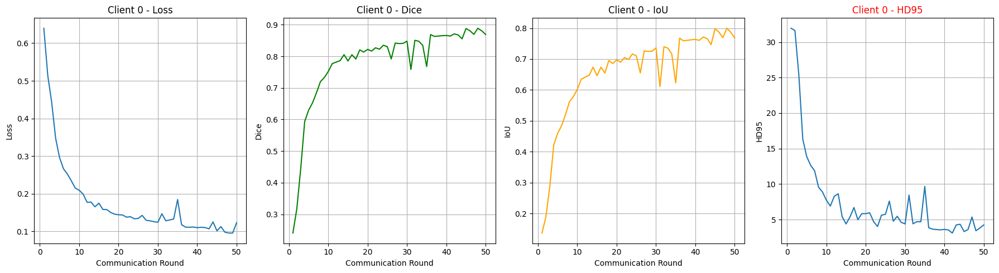

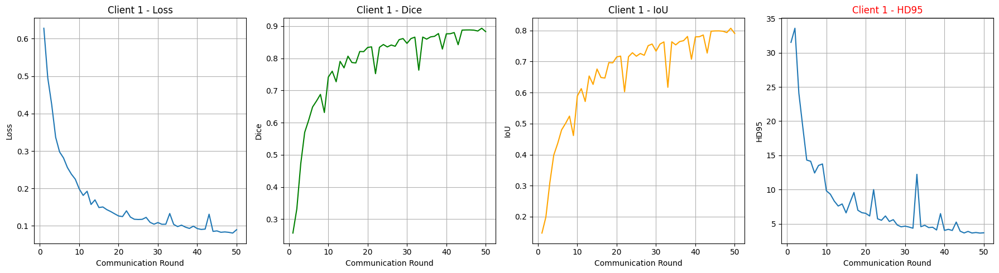

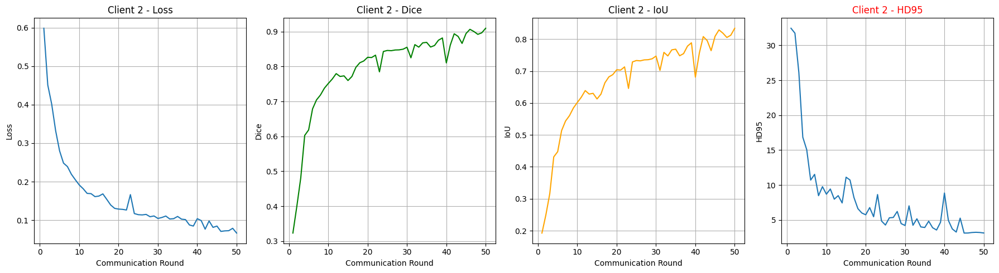

In [ ]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

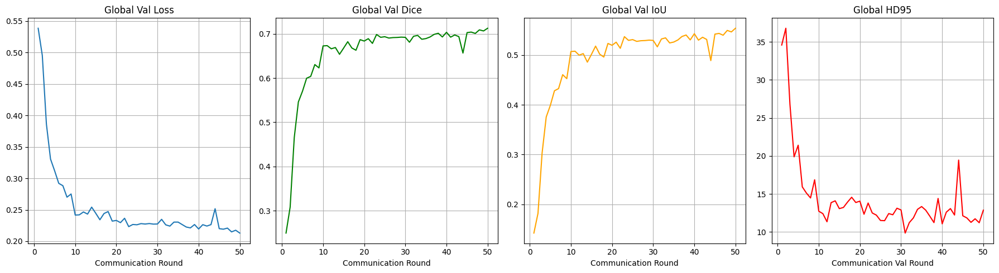

In [ ]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [ ]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_14180\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)

Testing:  46%|████▌     | 23/50 [00:05<00:06,  4.18it/s, Dice=0.6510, IoU=0.4825, HD95=13.9388]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  54%|█████▍    | 27/50 [00:06<00:05,  4.57it/s, Dice=0.5853, IoU=0.4137, HD95=16.8291]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:11<00:00,  4.43it/s, Dice=0.6490, IoU=0.4803, HD95=13.4730]


Test Set Metrics:
Dice: 0.6490
IoU: 0.4803
HD95: 13.4730


**Visualize**

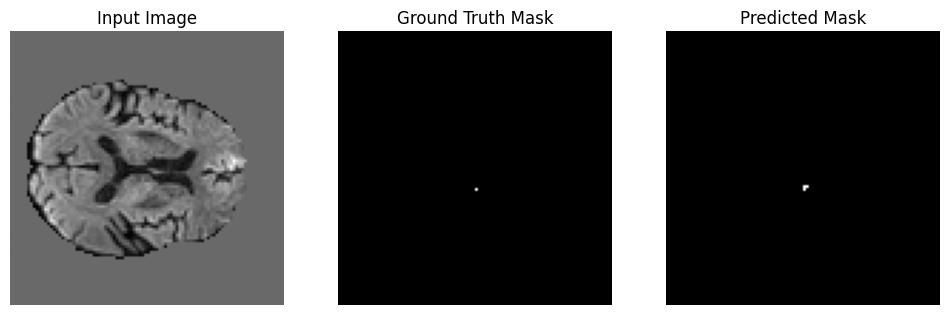

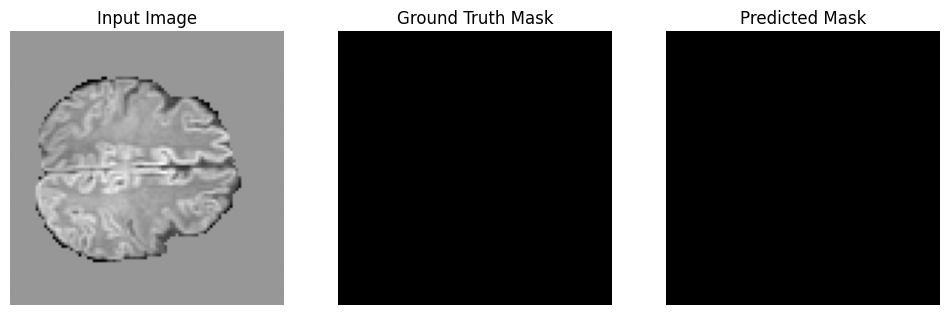

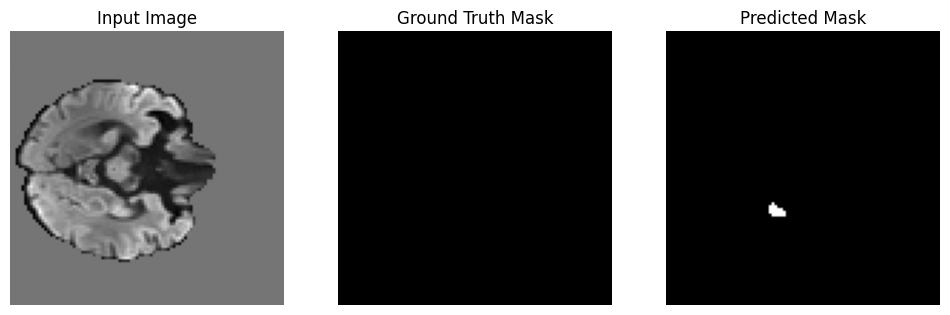

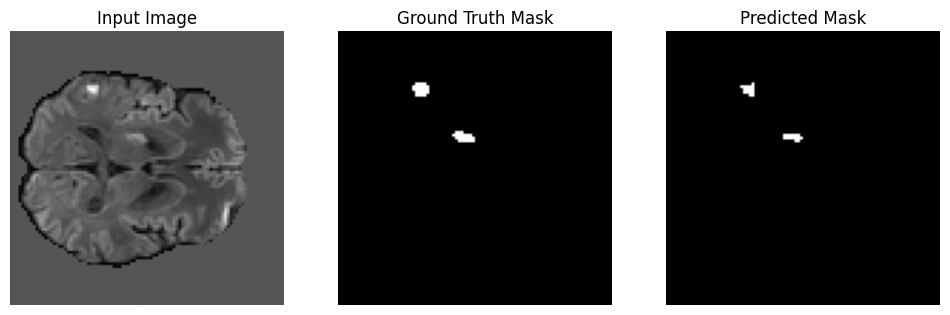

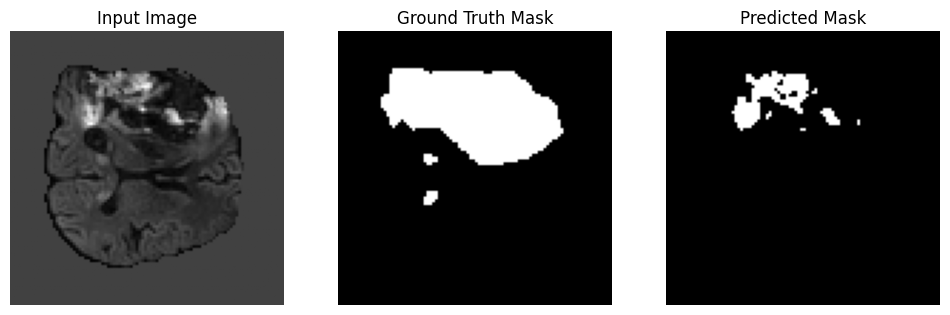

...

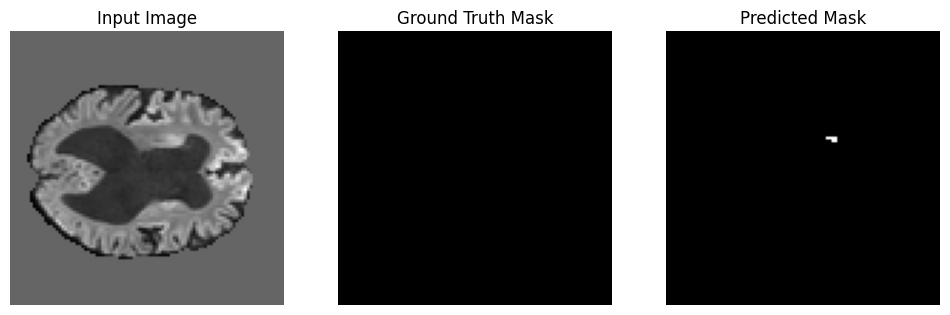

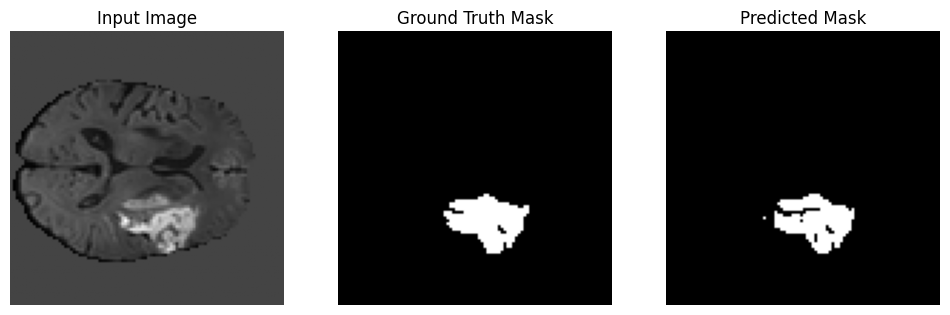

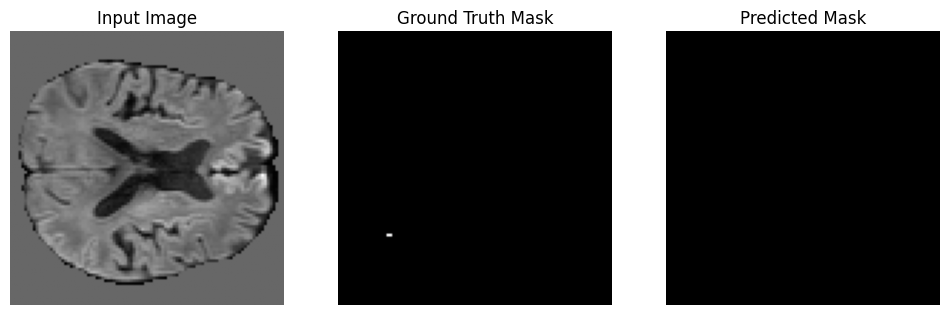

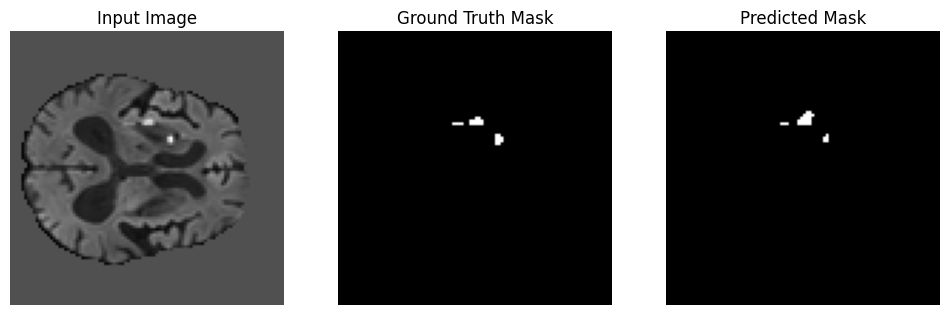

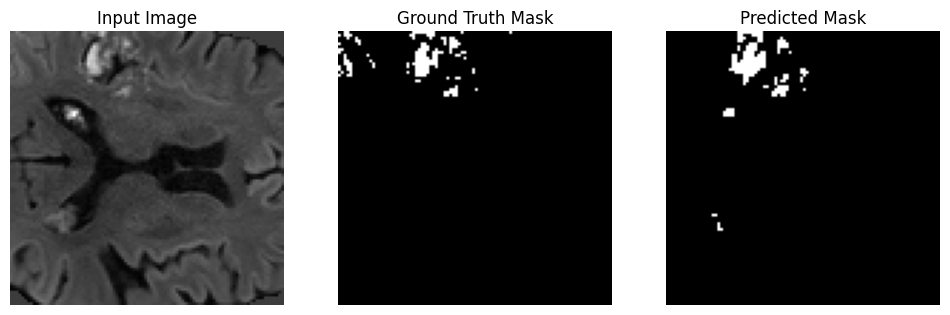

In [ ]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()